In [2]:
import pandas as pd
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

# **Knowing the given data**

In [3]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [4]:
data.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


In [5]:
data.shape

(7787, 12)

In [6]:
print(f'number of rows : {data.shape[0]}  \nnumber of columns : {data.shape[1]}')

number of rows : 7787  
number of columns : 12


# **Understanding the Variables of the dataset**

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


In [8]:
data.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

**Results: Director, cast, country, date_added, and rating all have null values. The date_added feature contains dates, but its datatype incorrectly associates an object.**

In [9]:
# Description of the dataset containing only numerical variables
data.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000


**Results: The release_year feature is numerical, representing the year each title was released. All Netflix content in the dataset spans from 1925 to 2021.**

In [10]:
# Description of Dataset of all categorical variables
data.describe(include='object')

,show_id,type,title,director,cast,country,date_added,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,14,216,492,7769
top,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,2863,1608,334,3


Results:

1.   Movies dominate the Netflix catalog in this dataset.
2.   The majority of content is produced in the United States.
3.   Documentaries are the most common genre across titles.


### Dataset Overview
1.   The dataset comes from the online streaming domain and is used to perform clustering and build a content-based recommendation system.
2.   Clustering helps group similar items without prior labels, revealing natural patterns in the data.
3.   It contains **7,787 rows and 12 columns**, with missing values in `director`, `cast`, `country`, `date_added`, and `rating`.


# **Import Libraries**

In [11]:
# Import Libraries and modules

# libraries that are used for analysis and visualization
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

# libraries used to process textual data
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

# libraries used to implement clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

# libraries that are used to construct a recommendation system
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Library of warnings would assist in ignoring warnings issued
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


# **EDA**
EDA (Exploratory Data Analysis) is the process of exploring and understanding a dataset to uncover insights, patterns, and relationships. It helps identify outliers, missing values, and data quality issues. EDA is a critical first step in data science, guiding decisions for further analysis and modeling.

**Column: 'type'**

In [12]:
data.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [13]:
# Understanding the different categories in 'type'
data['type'].value_counts()

,count
type,
Movie,5377
TV Show,2410


**Visualizing the coloumn "type"**

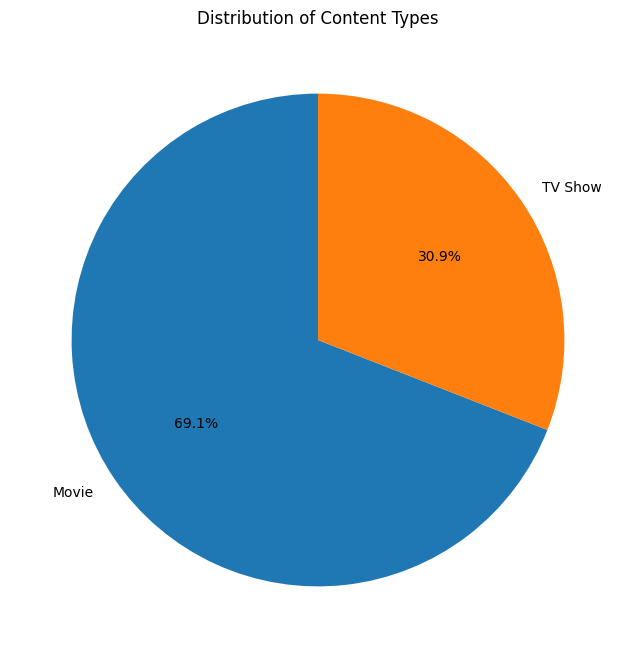

In [14]:
# Plotting the distribution of content types
plt.figure(figsize=(8, 8))
plt.pie(data['type'].value_counts(), labels=data['type'].value_counts().index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Content Types')
plt.show()



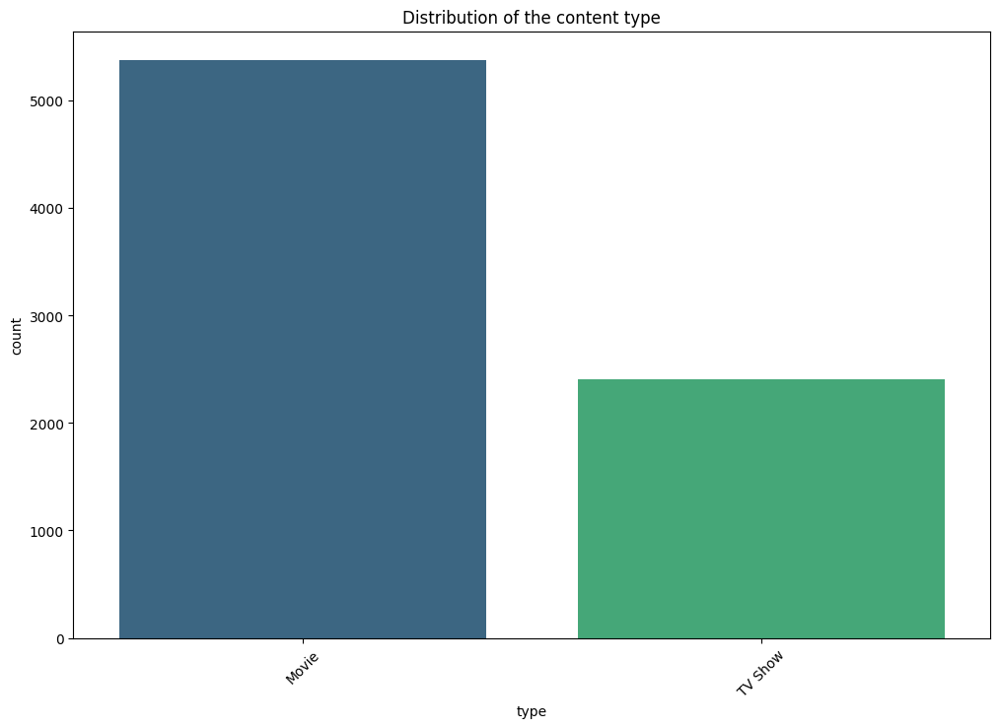

In [15]:
plt.figure(figsize=(12, 8))
sns.countplot(x='type', data=data, palette='viridis', order=data['type'].value_counts().index)
plt.title('Distribution of the content type')
plt.xticks(rotation=45)
plt.show()

**Results: Movies has more number of counts than TV Shows.
31% of the data are from TV shows, while 69% of the data are from movies**

**Column: "Title"**

In [16]:
# Understanding the title of the dataset
data['title'].nunique()

7787

**Visualization of Column "Title"**

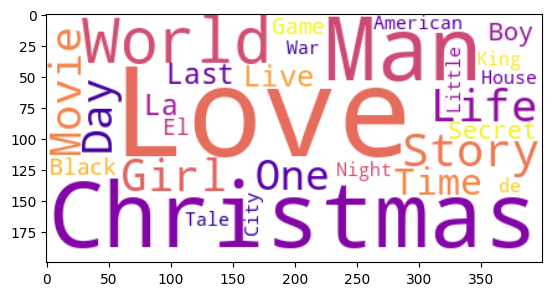

In [17]:
# text documents
text = " ".join(word for word in data['title'])

# create the word cloud using WordCloud library
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', min_font_size=15, colormap='plasma').generate(text)

# plot the word cloud
plt.imshow(wordcloud,  interpolation='bilinear')
plt.show()

**Results: Words like 'Love', 'Christmas', 'Man', 'World', 'Life', 'Girl', and 'Story' are frequently used in the coloumn of "title" in dataset**

**Column: "Directors"**

In [18]:
print(f'number of unique directors : {data.director.nunique()}')
print(f'null values in the column : {data.director.isna().sum()}')

number of unique directors : 4049
null values in the column : 2389


In [19]:
print(f"Number of Movies directed by directors are : { data[data['type']=='TV Show']['director'].value_counts().sum()}")
print(f"Number of TV shows directed by directors are : { data[data['type']=='Movie']['director'].value_counts().sum()}")

Number of Movies directed by directors are : 184
Number of TV shows directed by directors are : 5214


**Visualization of Column "Directors"**

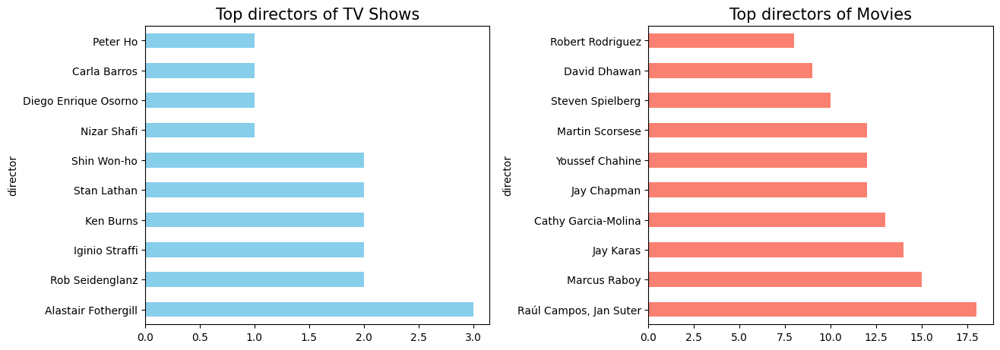

In [20]:
fig,ax = plt.subplots(1,2, figsize=(14,5))

# top 10 directors who directed TV shows
tv_shows = data[data['type']=='TV Show']['director'].value_counts()[:10].plot(kind='barh', ax=ax[0], color='skyblue')
tv_shows.set_title('Top directors of TV Shows', size=15)

# top 10 directors who directed Movies
movies = data[data['type']=='Movie']['director'].value_counts()[:10].plot(kind='barh', ax=ax[1], color='salmon')
movies.set_title('Top directors of Movies', size=15)


plt.tight_layout(pad=1.2, rect=[0, 0, 0.95, 0.95])
plt.show()

**Results: The top three shows in the dataset are directed by Alastair Fothergill. Jan Suter and Raúl Campos have each directed 18 titles the highest count among all directors in the dataset**


**Column: 'cast'**

In [21]:
data['cast']

,cast
0,"João Miguel, Bianca Comparato, Michel Gomes, R..."
1,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ..."
2,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ..."
3,"Elijah Wood, John C. Reilly, Jennifer Connelly..."
4,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar..."
...,...
7782,"Imad Creidi, Antoinette Turk, Elias Gergi, Car..."
7783,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan..."
7784,Nasty C
7785,"Adriano Zumbo, Rachel Khoo"


In [22]:
# seperating actors present in the column of cast
cast = data['cast'].str.split(', ', expand=True).stack()

# top actors name who play highest role in movie/show.
cast.value_counts()

,count
Anupam Kher,42
Shah Rukh Khan,35
Naseeruddin Shah,30
Om Puri,30
Takahiro Sakurai,29
...,...
Anita Shabdish,1
Malkeet Rauni,1
Meghna Malik,1
Raaghav Chanana,1


In [23]:
# Actors in TV Shows
tv_show_cast = data[data['type']=='TV Show']['cast'].str.split(', ', expand=True).stack()
print("Top 10 Actors in TV Shows:")
print(tv_show_cast.value_counts().head(10))

print("\n--------------------------------------------------\n")

# Actors in Movies
movie_cast = data[data['type']=='Movie']['cast'].str.split(', ', expand=True).stack()
print("Top 10 Actors in Movies:")
print(movie_cast.value_counts().head(10))

Top 10 Actors in TV Shows:
Takahiro Sakurai      22
Yuki Kaji             17
Ai Kayano             16
Daisuke Ono           16
Junichi Suwabe        15
Yoshimasa Hosoya      14
Yuichi Nakamura       14
David Attenborough    13
Jun Fukuyama          13
Vincent Tong          13
Name: count, dtype: int64

--------------------------------------------------

Top 10 Actors in Movies:
Anupam Kher         41
Shah Rukh Khan      35
Naseeruddin Shah    30
Om Puri             30
Akshay Kumar        29
Boman Irani         27
Amitabh Bachchan    27
Paresh Rawal        27
Kareena Kapoor      25
Ajay Devgn          21
Name: count, dtype: int64


In [24]:
print(f"Number of TV Shows actors: {len(data[data['type']=='TV Show']['cast'].str.split(', ',expand=True).stack().value_counts())}")
print(f"Number of Movies actors: {len(data[data['type']=='Movie']['cast'].str.split(', ', expand=True).stack().value_counts())}")


Number of TV Shows actors: 13585
Number of Movies actors: 23049


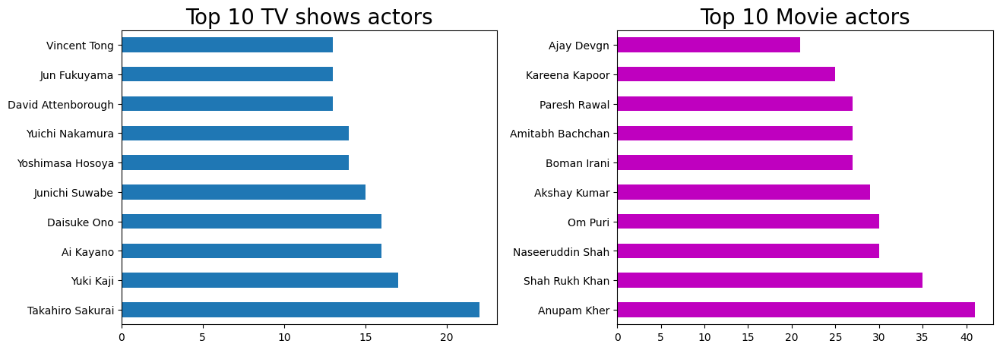

In [25]:
fig,ax = plt.subplots(1,2, figsize=(14,5))

# seperating TV shows actor from cast column
top_TVshows_actor = data[data['type']=='TV Show']['cast'].str.split(', ', expand=True).stack()
# plotting actor who appeared in highest number of TV Show
a = top_TVshows_actor.value_counts().head(10).plot(kind='barh', ax=ax[0])
a.set_title('Top 10 TV shows actors', size=20)

# seperating movie actor from cast column
top_movie_actor = data[data['type']=='Movie']['cast'].str.split(', ', expand=True).stack()
# plotting actor who appeared in highest number of Movie
b = top_movie_actor.value_counts().head(10).plot(kind='barh', ax=ax[1],color= 'm')
b.set_title('Top 10 Movie actors', size=20)

plt.tight_layout(pad=1.2, rect=[0, 0, 0.95, 0.95])
plt.show()

**Results: Anupam Kher, Shahrukh Khan, and Om Puri appear most frequently in movie roles. In TV shows, Takahiro Sakurai, Yuki Kaji, and Daisuke Ono have the highest number of appearances**

** Column: 'country'**

In [26]:
# number of unique values
data['country'].nunique()

681

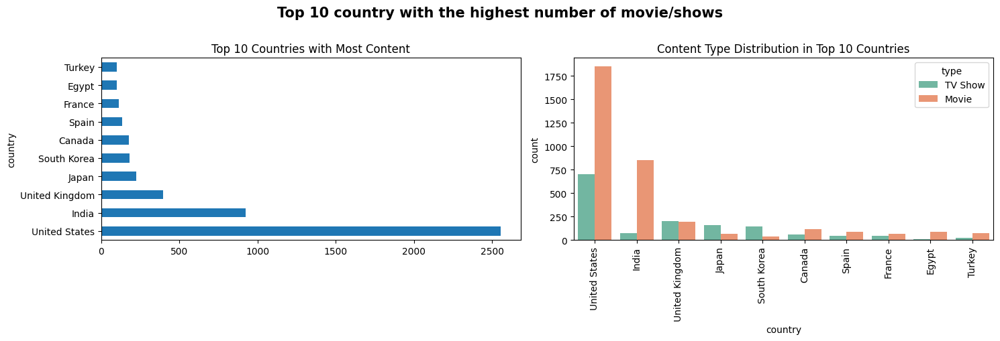

In [27]:
fig,ax = plt.subplots(1,2, figsize=(15,5))
plt.suptitle('Top 10 country with the highest number of movie/shows', weight='bold', size=15, y=1.01)

# univariate analysis
data['country'].value_counts().nlargest(10).plot(kind='barh', ax=ax[0])
ax[0].set_title('Top 10 Countries with Most Content')


# bivariate analysis
graph = sns.countplot(x="country", data=data, hue='type', order=data['country'].value_counts().index[0:10], ax=ax[1], palette='Set2')
ax[1].set_title('Content Type Distribution in Top 10 Countries')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

**Results: The United States produced the highest number of titles, followed by India and the United Kingdom. In India and the U.S., movies outnumber TV shows. In the UK, Japan, and South Korea, TV shows are more prevalent than movies.**

** Column: 'release_year'**

In [28]:
# number of unique values
data['release_year'].nunique()

73

In [29]:
print(f'Oldest release year : {data.release_year.min()}')
print(f'Latest release year : {data.release_year.max()}')

Oldest release year : 1925
Latest release year : 2021


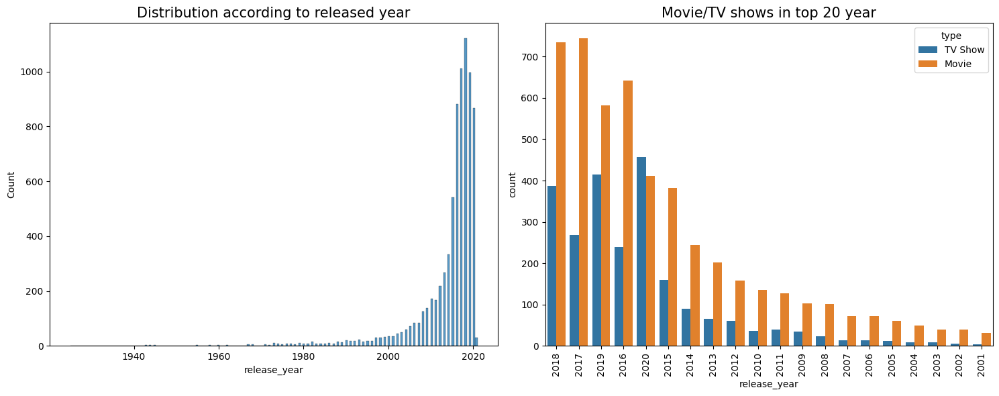

In [30]:
fig,ax = plt.subplots(1,2, figsize=(15,6))

# Univariate analysis
hist = sns.histplot(data['release_year'], ax=ax[0])
hist.set_title('Distribution according to released year', size=15)

# Bivariate analysis
count = sns.countplot(x="release_year", hue='type', data=data, order=data['release_year'].value_counts().index[0:20], ax=ax[1])
count.set_title('Movie/TV shows in top 20 year', size=15)
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()


**Results: Netflix has significantly increased its content releases in recent years. The majority of movies and TV shows were added between 2015 and 2020, with the peak in 2018.**

**Column: 'rating'**

In [31]:
# Finding the unique values
data.rating.nunique()

14

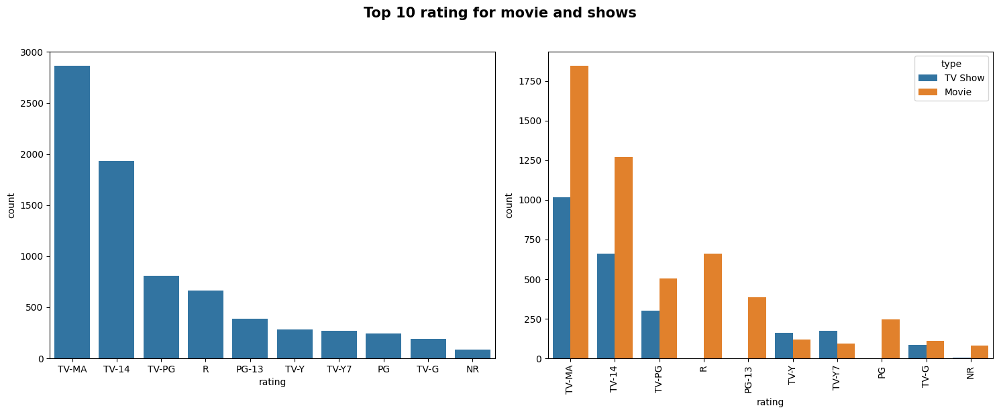

In [32]:
fig,ax = plt.subplots(1,2, figsize=(15,6))
plt.suptitle('Top 10 rating for movie and shows', weight='bold', y=1.02, size=15)

# univariate analysis
sns.countplot(x="rating", data=data, order=data['rating'].value_counts().index[0:10], ax=ax[0])

# bivariate analysis
graph = sns.countplot(x="rating", data=data, hue='type', order=data['rating'].value_counts().index[0:10], ax=ax[1])
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

**Results: Most titles on Netflix are rated TV-MA (Mature Audience), followed by TV-14 (Teen Audience). Movies dominate the higher rating categories, which aligns with their greater overall presence compared to TV shows, as noted earlier.**

**Column: 'listed_in'**

In [33]:
data['listed_in'].head()

,listed_in
0,"International TV Shows, TV Dramas, TV Sci-Fi &..."
1,"Dramas, International Movies"
2,"Horror Movies, International Movies"
3,"Action & Adventure, Independent Movies, Sci-Fi..."
4,Dramas


In [34]:
# seperating genre from listed_in columns
genres = data['listed_in'].str.split(', ', expand=True).stack()

# top 10 genres in listed movies/TV shows
genres = genres.value_counts().reset_index().rename(columns={'index':'genre', 0:'count'})
genres.head()


,genre,count
0,International Movies,2437
1,Dramas,2106
2,Comedies,1471
3,International TV Shows,1199
4,Documentaries,786


In [35]:
len(genres)

42

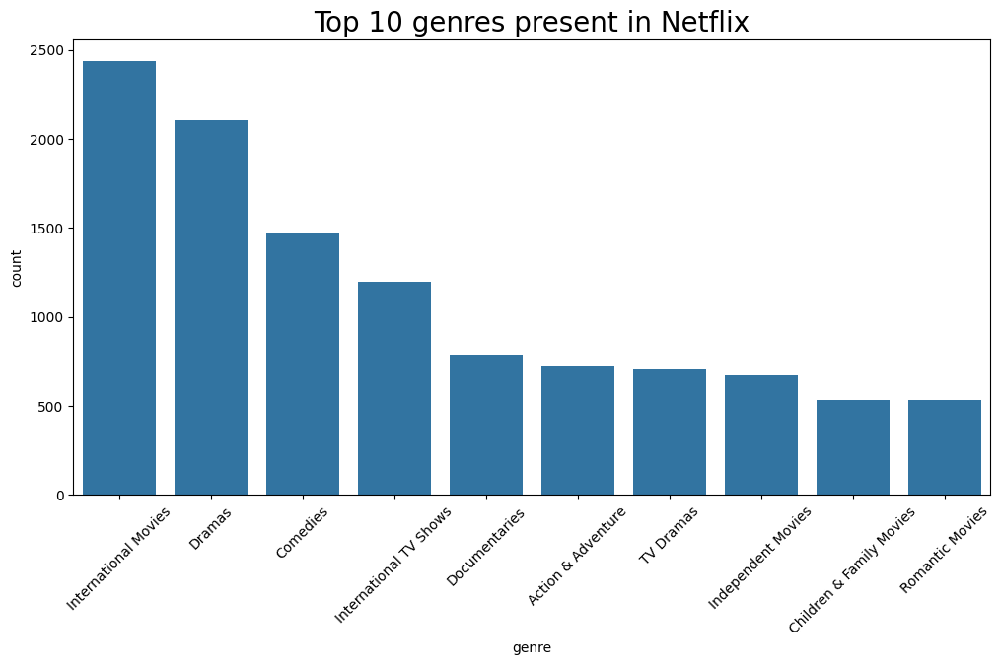

In [36]:
# plotting graph
plt.figure(figsize=(12,6))
# Top 10 genres
top = sns.barplot(x='genre', y = 'count', data=genres[:10])
top.set_title('Top 10 genres present in Netflix', size=20)
plt.xticks(rotation=45)

plt.show()

Results: International Movies, Dramas, and Comedies make up the majority of the genres.
TV Shows, Classic and cult TV, TV thrillers, Stand-Up comedy, and Talk shows account for the least genres.

**Column: 'description'**

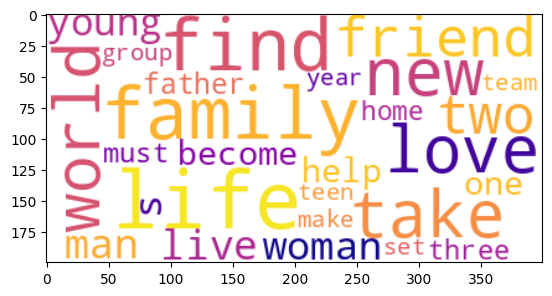

In [37]:
# text documents
text = " ".join(word for word in data['description'])

# create the word cloud using WordCloud library
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', min_font_size=15,colormap='plasma').generate(text)

# plot the word cloud
plt.imshow(wordcloud,  interpolation='bilinear')
plt.show()

**Results: The most frequently used words in the description column are "family," "find," "life," "love," "new world," and "friend".**


# **Data preprocessing:**


**Finding the duplicates in the dataset**

In [38]:
# Finding the duplicated values in the dataset
count_duplicated = data.duplicated().sum()
print(f'Dataset having {count_duplicated} duplicated values')

Dataset having 0 duplicated values


**Finding the missing/NULL values**

In [39]:
# Identifying the coloumns with null values along with its count in dataset
count_null_df = pd.DataFrame({
    'columns': data.columns,
    'number_of_nulls_values': data.isna().sum()
})
count_null_df.set_index('columns').sort_values(by='number_of_nulls_values', ascending=False)

,number_of_nulls_values
columns,
director,2389
cast,718
country,507
date_added,10
rating,7
title,0
show_id,0
type,0
release_year,0


In [40]:
# Missing Values Percentage
round(data.isna().sum()/len(data)*100, 2)

,0
show_id,0.00
type,0.00
title,0.00
director,30.68
cast,9.22
country,6.51
date_added,0.13
release_year,0.00
rating,0.09
duration,0.00


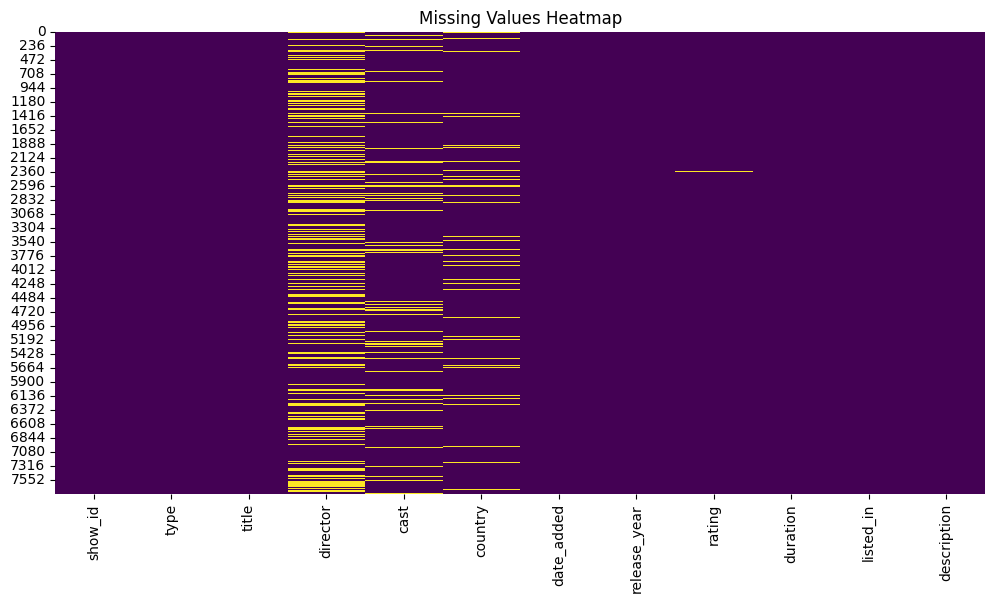

In [41]:
# Visualizing the missing values using Heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(data.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

Results:
1. There are **no duplicate entries**.
2. Each row represents a unique title. Since imputing missing values isn't feasible due to the uniqueness and small size of the data, **missing categorical values are replaced with empty strings** to retain all records.

In [42]:
# Handling Missing Values & Missing Value Imputation
data[['director','cast','country']] = data[['director','cast','country']].fillna(' ')
data.dropna(axis=0, inplace=True)

In [43]:
data.isna().sum()

,0
show_id,0
type,0
title,0
director,0
cast,0
country,0
date_added,0
release_year,0
rating,0
duration,0


<Axes: >

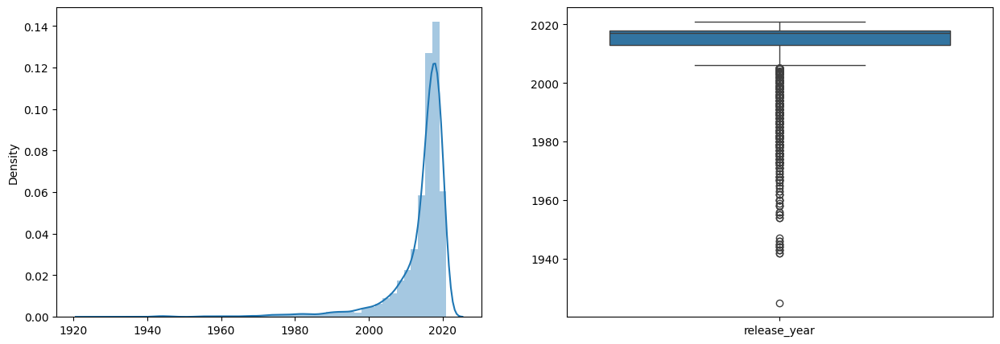

In [44]:
# Handling Outliers & Outlier treatments

# plotting graph
fig,ax = plt.subplots(1,2, figsize=(15,5))

# Display boxplot and dist plot.
sns.distplot(x=data['release_year'], ax=ax[0])
sns.boxplot(data=data, ax=ax[1])

**Results: Most features in the dataset are in text format, except for release_year. Since the clustering model relies primarily on categorical/textual data, outlier handling is not required in this case.**

Modelling Approach::
1. Select the attributes based on which you want to cluster the shows
2. Text preprocessing: Remove all non-ascii characters, stopwords and punctuation marks, convert all textual data to lowercase.
3. Lemmatization to generate a meaningful word out of corpus of words
4. Tokenization of corpus
5. Word vectorization
6. Dimensionality reduction
7. Use different algorithms to cluster the movies, obtain the optimal number of clusters using different techniques
8. Build optimal number of clusters and visualize the contents of each cluster using wordclouds.

# **Selecting Attributes**

Netflix movies and TV shows will be clustered based on the following textual characteristics:
Director; Cast; type; Country; Rating; Genres (listed_in); Description

In [45]:
# Combining all the attributes into a single column

data['clustering_attributes'] = (data['director'] + ' ' +
                                data['cast'] +' ' +
                                data['type'] +' ' +
                                data['country'] +' ' +
                                data['listed_in'] +' ' +
                                data['description'])

In [46]:
data['clustering_attributes'][0]

'  João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi TV Show Brazil International TV Shows, TV Dramas, TV Sci-Fi & Fantasy In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.'

# **Removing Stop words and Lower Casing.**

In [47]:
# create a set of English stop words
stop_words = stopwords.words('english')

# displaying stopwords
np.array(stop_words)

array(['a', 'about', 'above', 'after', 'again', 'against', 'ain', 'all',
       'am', 'an', 'and', 'any', 'are', 'aren', "aren't", 'as', 'at',
       'be', 'because', 'been', 'before', 'being', 'below', 'between',
       'both', 'but', 'by', 'can', 'couldn', "couldn't", 'd', 'did',
       'didn', "didn't", 'do', 'does', 'doesn', "doesn't", 'doing', 'don',
       "don't", 'down', 'during', 'each', 'few', 'for', 'from', 'further',
       'had', 'hadn', "hadn't", 'has', 'hasn', "hasn't", 'have', 'haven',
       "haven't", 'having', 'he', "he'd", "he'll", 'her', 'here', 'hers',
       'herself', "he's", 'him', 'himself', 'his', 'how', 'i', "i'd",
       'if', "i'll", "i'm", 'in', 'into', 'is', 'isn', "isn't", 'it',
       "it'd", "it'll", "it's", 'its', 'itself', "i've", 'just', 'll',
       'm', 'ma', 'me', 'mightn', "mightn't", 'more', 'most', 'mustn',
       "mustn't", 'my', 'myself', 'needn', "needn't", 'no', 'nor', 'not',
       'now', 'o', 'of', 'off', 'on', 'once', 'only', 'or', 'ot

In [48]:

def stopwords(text):
    '''a function for removing the stopword and lowercase the each word'''
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    # joining the list of words with space separator
    return " ".join(text)

In [49]:
# applying stopwords function.
data['clustering_attributes'] = data['clustering_attributes'].apply(stopwords)

In [50]:
data['clustering_attributes'][0]

'joão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschi tv show brazil international tv shows, tv dramas, tv sci-fi & fantasy future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor.'

**Results: Successfully changed the corpus to lowercase and removed all stopwords.**

# **Removing Punctuations by eliminating the ASCII values**

In [51]:
# function to remove punctuations
def remove_punctuation(text):
    '''a function for removing punctuation'''
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

In [52]:
data['clustering_attributes'] = data['clustering_attributes'].apply(remove_punctuation)

In [53]:
data['clustering_attributes'][0]

'joão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschi tv show brazil international tv shows tv dramas tv scifi  fantasy future elite inhabit island paradise far crowded slums get one chance join 3 saved squalor'

**Results: Successfully dropped all the punctuation marks from the corpus.**

# **Stemming**

In [54]:
##using SnowballStemmer to construct a meaningful word from a word corpus.
stemmer = SnowballStemmer("english")

# define a function to apply stemming using SnowballStemmer
def stemming(text):
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text)

In [55]:

# appying stemming function
data['clustering_attributes'] = data['clustering_attributes'].apply(stemming)

In [56]:
data['clustering_attributes'][0]

'joão miguel bianca comparato michel gome rodolfo valent vaneza oliveira rafael lozano vivian porto mel fronckowiak sergio mamberti zezé motta celso frateschi tv show brazil intern tv show tv drama tv scifi fantasi futur elit inhabit island paradis far crowd slum get one chanc join 3 save squalor'

# **Text Vectorization**

In [57]:
# create the object of tfid vectorizer
tfidf = TfidfVectorizer(stop_words='english', lowercase=False, max_features = 10000)   # max features = 10000 to prevent system from crashing

# fit the vectorizer using the text data
tfidf.fit(data['clustering_attributes'])

# collect the vocabulary items used in the vectorizer
dictionary = tfidf.vocabulary_.items()

In [58]:
print(len(dictionary)) #number of independent features created from "clustering_attributes" columns

10000


In [59]:
# convert vector into array form for clustering
vector = tfidf.transform(data['clustering_attributes']).toarray()

# summarize encoded vector
print(vector)
print(f'shape of the vector : {vector.shape}')
print(f'datatype : {type(vector)}')


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
shape of the vector : (7770, 10000)
datatype : <class 'numpy.ndarray'>


# **Dimensionality Reduction**

In [60]:
# using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(vector)

PCA(random_state=42)

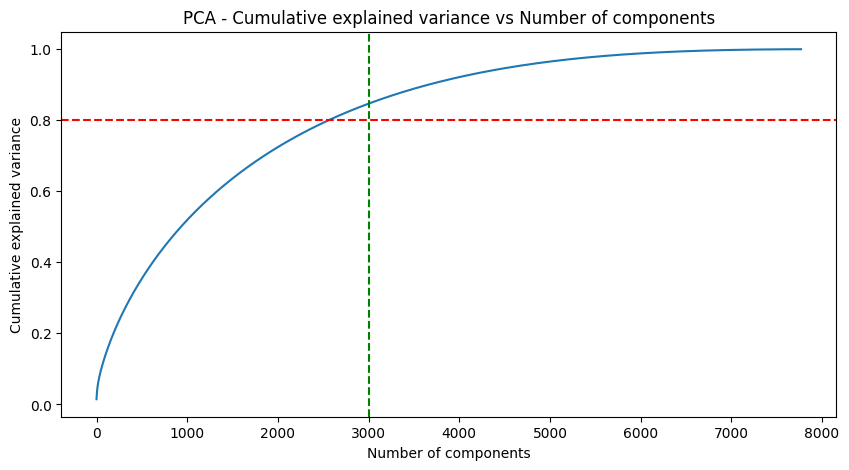

In [61]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - Cumulative explained variance vs Number of components')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3000, color='green', linestyle='--')
plt.show()

Results: Analysis shows that approximately 7,500 components explain 100% of the variance, while the top 3,000 components capture over 80% of it.
Hence, selecting the top 3,000 components allows for effective dimensionality reduction, simplifying the model without significant loss of information.

In [62]:
# reducing the dimensions to 3000 using pca
pca = PCA(n_components=3000, random_state=42)
pca.fit(vector)

PCA(n_components=3000, random_state=42)

In [63]:
# transformed features
X = pca.transform(vector)

# shape of transformed vectors
X.shape

(7770, 3000)

# **Unsupervised Machine Learning Model Implementation**

# **K-mean clustering**

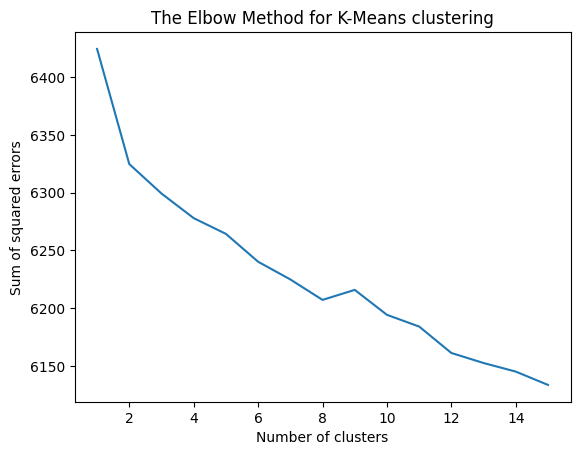

In [64]:
'''Elbow method to find the optimal value of K'''

# Initialize a list to store the sum of squared errors for each value of K
SSE = []

for k in range(1, 16):
  # Initialize the k-means model with the current value of K
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Compute the sum of squared errors for the model
  SSE.append(kmeans.inertia_)

# Plot the values of SSE
plt.plot(range(1, 16), SSE)
plt.title('The Elbow Method for K-Means clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.show()

Result: The sum of squared distance between each point and the centroid in a cluster (WCSS) decreases with the increase in the number of clusters.

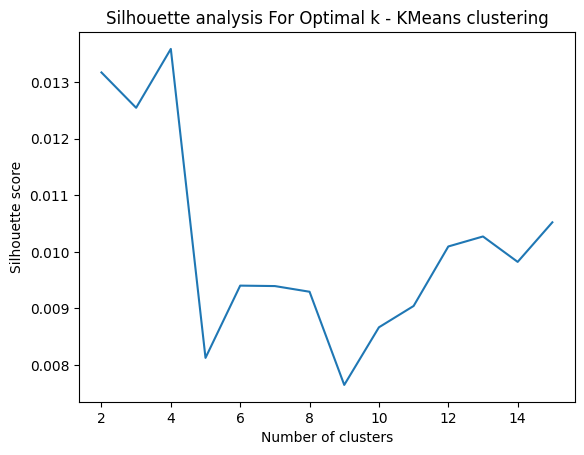

In [65]:
'''Silhouette score method to find the optimal value of k'''

# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

for k in range(2, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Predict the cluster labels for each point in the data
  labels = kmeans.labels_
  # Compute the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_avg.append(score)

# Plot the Silhouette analysis
plt.plot(range(2,16), silhouette_avg)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

In [114]:
## Finding the optimal number of clusters using the Silhouette Score Method

# Import from KMeans algoritham and metric silhouette_score
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.metrics import silhouette_samples, silhouette_score

num_of_cluster=range(2,31)

for i in num_of_cluster:
    clusterer=KMeans(n_clusters=i)
    preds=clusterer.fit_predict(X)
    centers=clusterer.cluster_centers_
    score=silhouette_score(X, preds)
    print(f"For number of clusters = {i}, silhouette score is {score}")

For number of clusters = 2, silhouette score is 0.013167933810778224
For number of clusters = 3, silhouette score is 0.012549769127171035
For number of clusters = 4, silhouette score is 0.011935613583118045
For number of clusters = 5, silhouette score is 0.007354398633387004
For number of clusters = 6, silhouette score is 0.007745199285281889
For number of clusters = 7, silhouette score is 0.007930587202779787
For number of clusters = 8, silhouette score is 0.007550485032034396
For number of clusters = 9, silhouette score is 0.009425276335766099
For number of clusters = 10, silhouette score is 0.011662999206041988
For number of clusters = 11, silhouette score is 0.010278731979498988
For number of clusters = 12, silhouette score is 0.01167757541568233
For number of clusters = 13, silhouette score is 0.009651160537922756
For number of clusters = 14, silhouette score is 0.011573799585057406
For number of clusters = 15, silhouette score is 0.01043410283411864
For number of clusters = 16, s

In [66]:
# Clustering the data into 4 clusters
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=33)
kmeans.fit(X)

KMeans(n_clusters=4, random_state=33)

In [67]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(6274.2365515702295, np.float64(0.01371416595973223))


In [68]:
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score

# Calculate Calinski-Harabasz Score
calinski_harabasz = calinski_harabasz_score(X, kmeans.labels_)
print(f"Calinski-Harabasz Score: {calinski_harabasz}")

# Calculate Davies-Bouldin Score
davies_bouldin = davies_bouldin_score(X, kmeans.labels_)
print(f"Davies-Bouldin Score: {davies_bouldin}")

Calinski-Harabasz Score: 61.958656196917055
Davies-Bouldin Score: 10.333230488188121


In [69]:
# Adding a kmeans cluster number attribute
data['kmeans_cluster'] = kmeans.labels_

In [70]:
# Predict result
y_predict= kmeans.predict(X)
y_predict

array([2, 3, 3, ..., 0, 2, 0], dtype=int32)

In [69]:
data

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,clustering_attributes,kmeans_cluster
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,joão miguel bianca comparato michel gome rodol...,2
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,jorg michel grau demián bichir héctor bonilla ...,3
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",gilbert chan tedd chan stella chung henley hii...,3
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",shane acker elijah wood john c reilli jennif c...,1
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,robert luket jim sturgess kevin spacey kate bo...,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...,josef fare imad creidi antoinett turk elia ger...,3
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...,mozez singh vicki kaushal sarahjan dia raaghav...,3
7784,s7785,Movie,Zulu Man in Japan,,Nasty C,,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast...",nasti c movi documentari intern movi music mus...,0
7785,s7786,TV Show,Zumbo's Just Desserts,,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...,adriano zumbo rachel khoo tv show australia in...,2


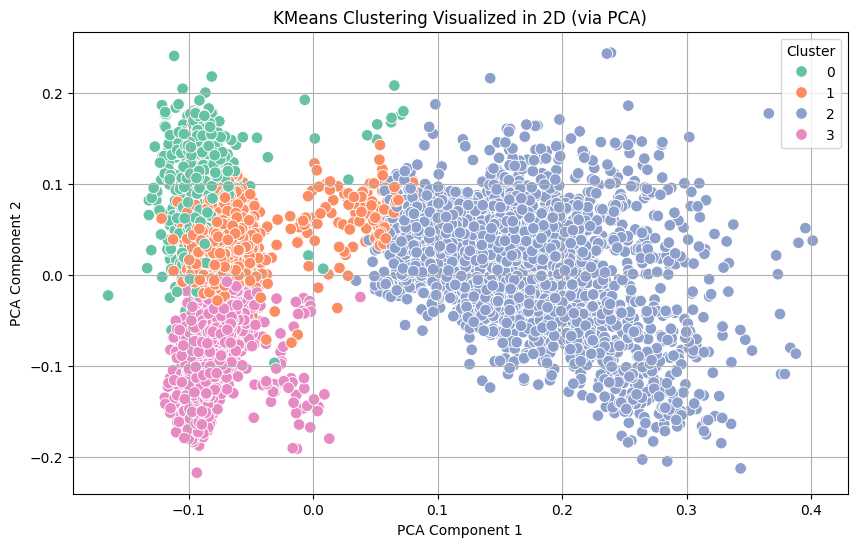

In [70]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Reduce dimensionality to 2D using PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X)

# Add PCA results to DataFrame
data['pca_1'] = pca_result[:, 0]
data['pca_2'] = pca_result[:, 1]

# Scatter plot of clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='pca_1', y='pca_2', hue='kmeans_cluster', palette='Set2', s=70)
plt.title('KMeans Clustering Visualized in 2D (via PCA)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster', loc='best')
plt.grid(True)
plt.show()


Results: Analysis shows that the Clusters are well-separated, especially Cluster 2 (blue), which dominates the right side of the plot.
Clusters 0 (green), 1 (orange), and 3 (pink) are more compact and overlap slightly on the left side.

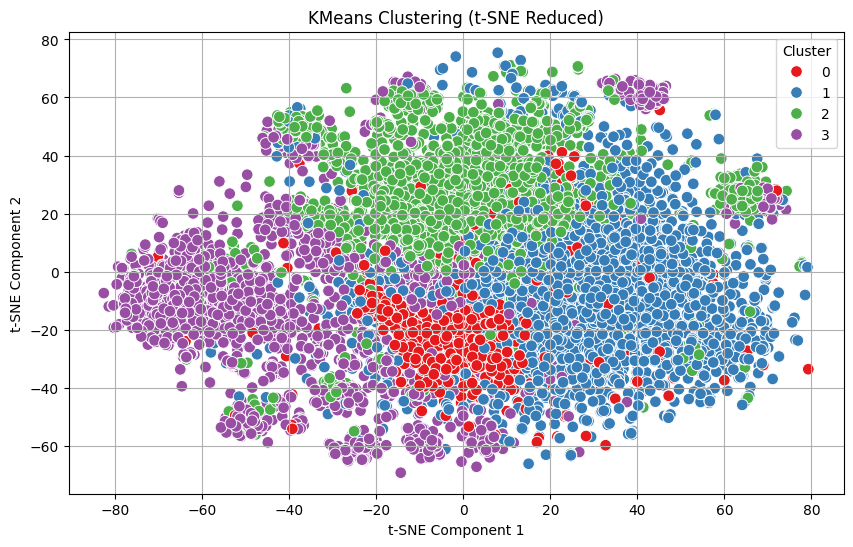

In [71]:
from sklearn.manifold import TSNE

# t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_result = tsne.fit_transform(X)

# Add to DataFrame
data['tsne_1'] = tsne_result[:, 0]
data['tsne_2'] = tsne_result[:, 1]

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='tsne_1', y='tsne_2', hue='kmeans_cluster', palette='Set1', s=70)
plt.title('KMeans Clustering (t-SNE Reduced)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster', loc='best')
plt.grid(True)
plt.show()


Results: The t-SNE scatter plot reveals that KMeans clustering has grouped Netflix titles into four meaningful clusters with some degree of separation. Cluster 3 is clearly distinct, while Clusters 1 and 2 show some overlap, suggesting those titles share similar metadata (e.g., genres, ratings, types). The variation in cluster density suggests that certain content types are tightly grouped (like niche genres or ratings), while others are more diverse. This supports the use of clustering to uncover hidden structure in the Netflix catalog.

Bar Plot of Avg Ratings per Kmean Cluster

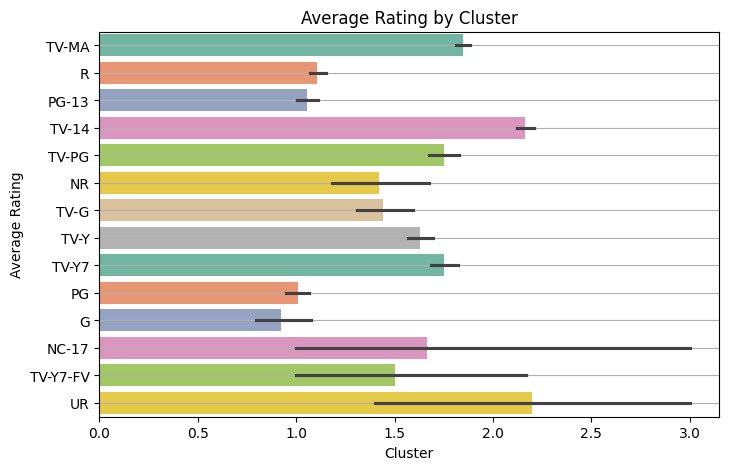

In [72]:
plt.figure(figsize=(8, 5))
sns.barplot(data=data, x='kmeans_cluster', y='rating', palette='Set2', estimator='mean')
plt.title("Average Rating by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Average Rating")
plt.grid(axis='y')
plt.show()

Results: In the context of Netflix, a TV-MA rating means the content is specifically designed for mature audiences and may be inappropriate for viewers under the age of 17.
also, "UR" is not a standard maturity rating.

The clusters seem to group content based on how mature the content is, and this helps us understand what kind of shows or movies are grouped together.

Count of Items per Cluster

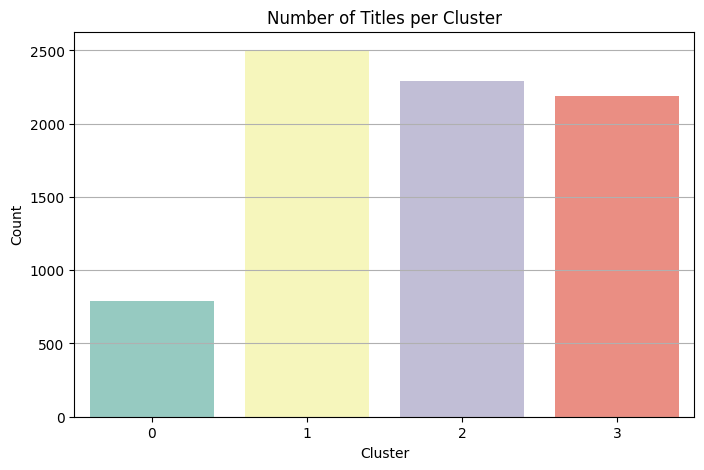

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
sns.countplot(data=data, x='kmeans_cluster', palette='Set3')
plt.title("Number of Titles per Cluster")
plt.xlabel("Cluster")
plt.ylabel("Count")
plt.grid(axis='y')
plt.show()

Results: this analysis shows the number of titles are more in first k mean cluster

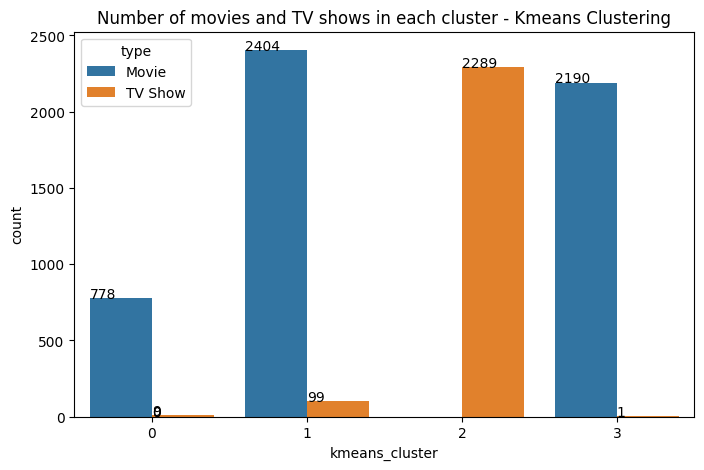

In [74]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(8,5))
graph = sns.countplot(x='kmeans_cluster',data=data, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')

# adding value count on the top of bar
for p in graph.patches:
  graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

results: Built 4 clusters using the k-means clustering algorithm.Some clusters are primarily TV Shows, while others are mainly Movies. This suggests that content format (short-form vs long-form) plays a key role in how Netflix titles group together.

In [75]:
def kmeans_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  data_wordcloud = data[['kmeans_cluster',column_name]].dropna()
  data_wordcloud = data_wordcloud[data_wordcloud['kmeans_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in data_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

Word Cloud on "country" column column for different cluster

cluster 0


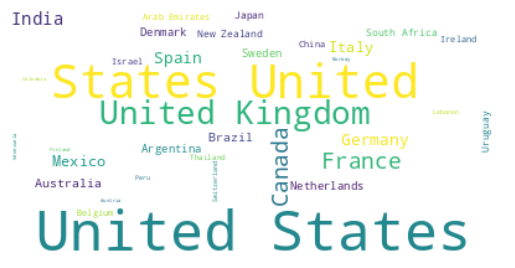

cluster 1


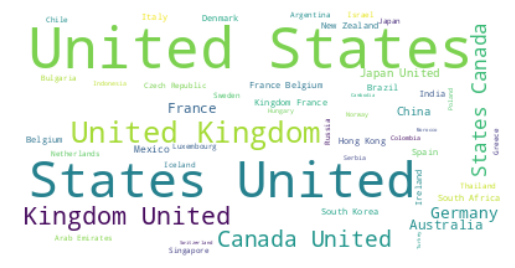

cluster 2


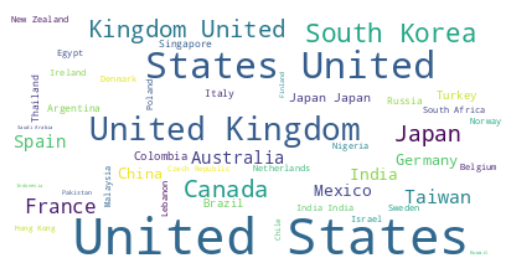

cluster 3


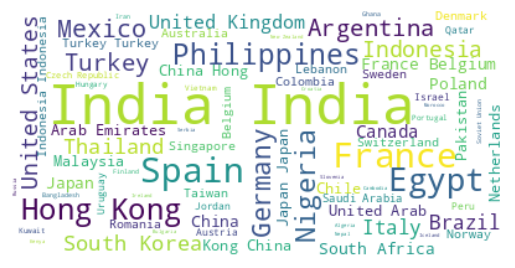

In [76]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

Word Cloud on "title"column column for different cluster

cluster 0


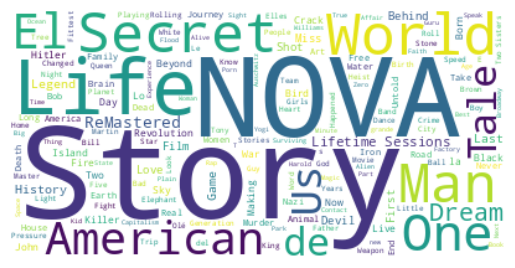

cluster 1


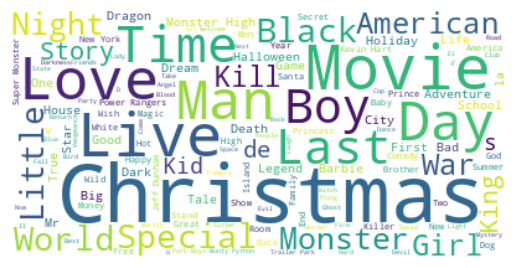

cluster 2


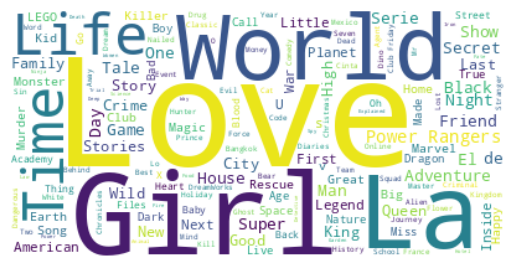

cluster 3


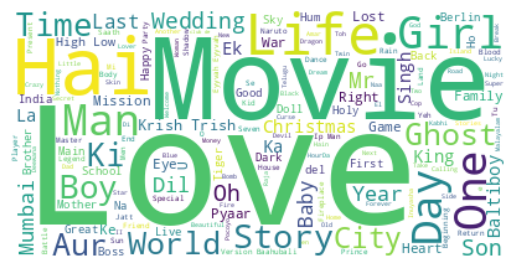

In [77]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'title')

Word Cloud on "description" column for different cluster


cluster 0


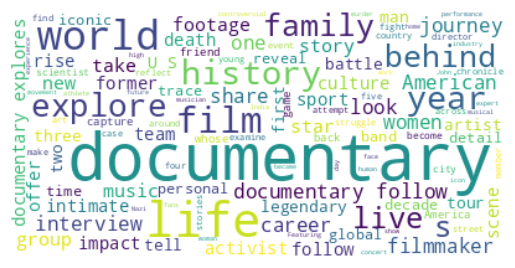

cluster 1


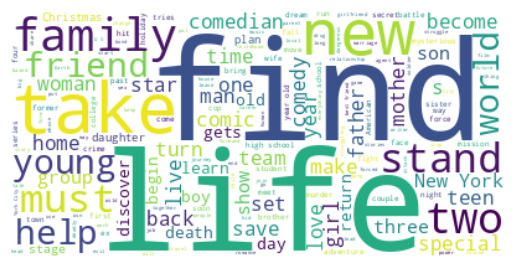

cluster 2


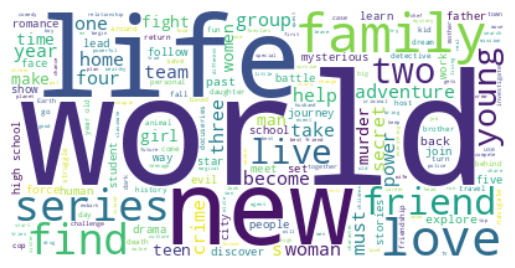

cluster 3


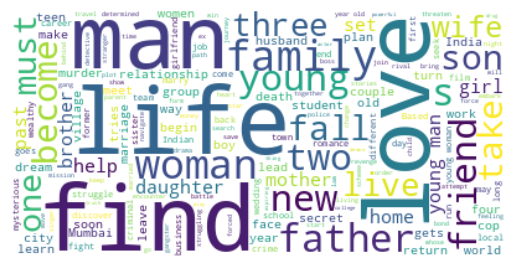

In [78]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

Word Cloud on "cast" column for different cluster

cluster 0


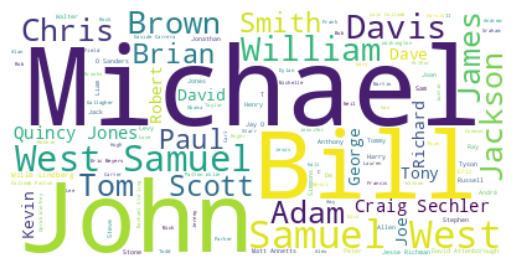

cluster 1


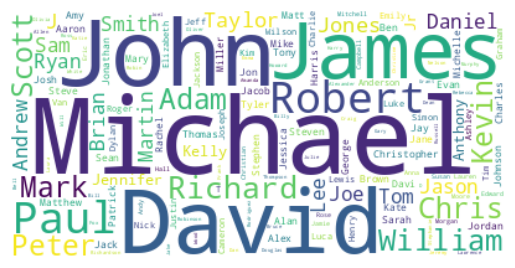

cluster 2


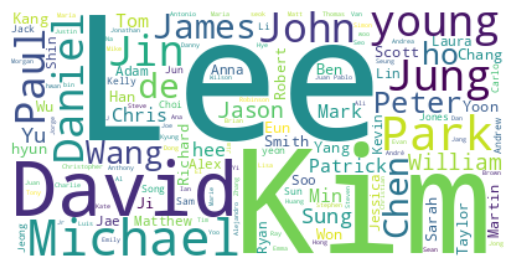

cluster 3


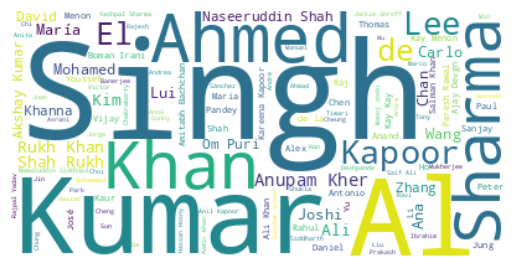

In [79]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

Word Cloud on "director" column for different cluster

cluster 0


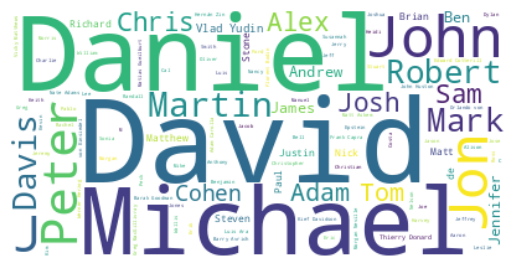

cluster 1


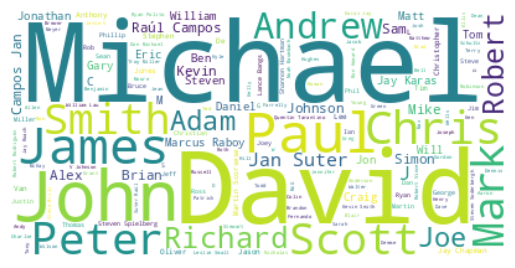

cluster 2


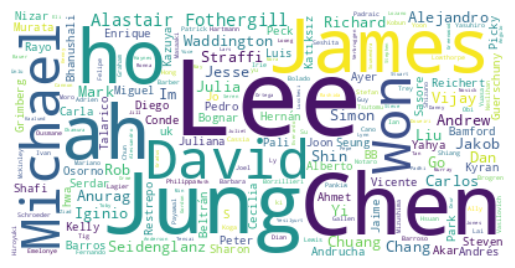

cluster 3


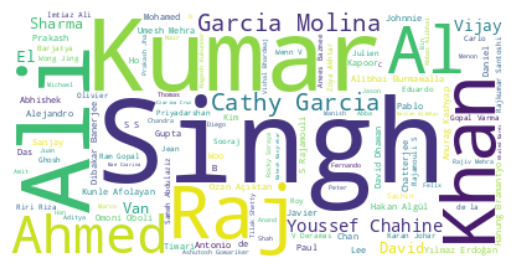

In [80]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'director')

Word Cloud on "listed_in" (genre) col for different cluster

cluster 0


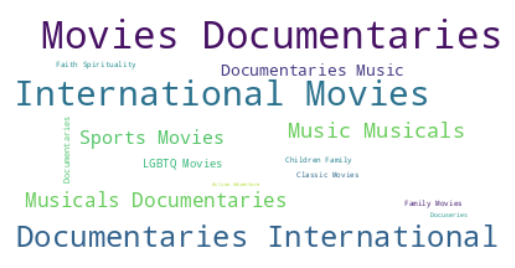

cluster 1


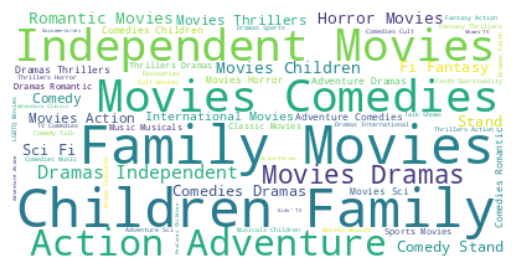

cluster 2


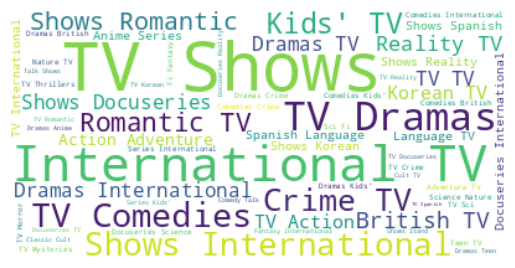

cluster 3


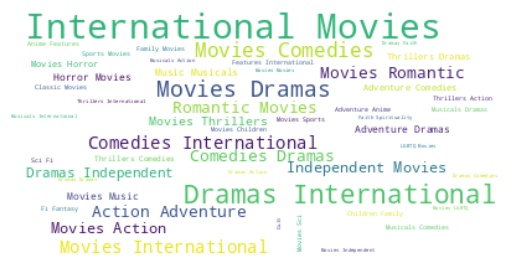

In [81]:
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')


# **Hierarchical** clustering

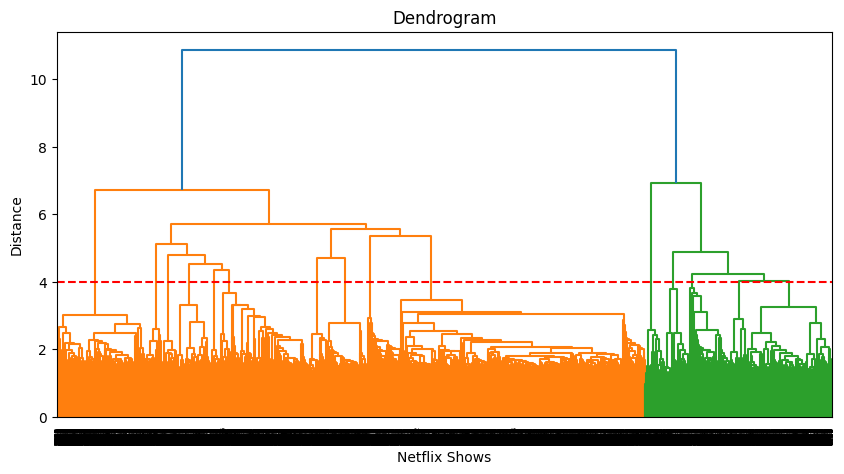

In [82]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(10, 5))
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 4, color='r', linestyle='--')

Result: At a distance of 4 units, 13 clusters can be built using the agglomerative clustering algorithm.

In [83]:
##Building 13 clusters using the Agglomerative clustering algorithm:

# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=13, metric='euclidean', linkage='ward')
hierarchical.fit_predict(X)


array([ 3,  2,  4, ..., 10,  0, 10])

In [84]:
# Adding a hierarchical cluster number attribute
data['hierarchical_clusters'] = hierarchical.labels_

In [85]:
data

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,clustering_attributes,kmeans_cluster,pca_1,pca_2,tsne_1,tsne_2,hierarchical_clusters
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,joão miguel bianca comparato michel gome rodol...,2,0.177728,-0.025673,-18.840490,17.807442,3
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,jorg michel grau demián bichir héctor bonilla ...,3,-0.064391,-0.041574,-36.598679,9.634900,2
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",gilbert chan tedd chan stella chung henley hii...,3,-0.068930,-0.041748,-18.751755,44.942730,4
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",shane acker elijah wood john c reilli jennif c...,1,-0.078047,0.056334,30.966457,10.063242,4
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,robert luket jim sturgess kevin spacey kate bo...,1,-0.057438,0.040611,24.027420,9.229768,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...,josef fare imad creidi antoinett turk elia ger...,3,-0.069230,-0.007731,0.143547,2.275542,3
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...,mozez singh vicki kaushal sarahjan dia raaghav...,3,-0.104267,-0.077825,-61.044472,10.891316,10
7784,s7785,Movie,Zulu Man in Japan,,Nasty C,,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast...",nasti c movi documentari intern movi music mus...,0,-0.103166,0.061877,-20.948158,-10.787927,10
7785,s7786,TV Show,Zumbo's Just Desserts,,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...,adriano zumbo rachel khoo tv show australia in...,2,0.183341,-0.001436,-3.793535,38.779617,0


**Bar Plot of Cluster Counts**

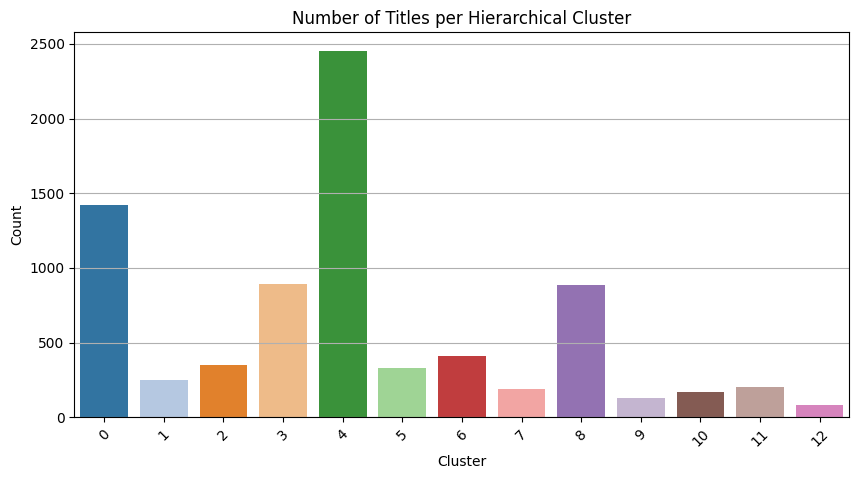

In [86]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
sns.countplot(data=data, x='hierarchical_clusters', palette='tab20')
plt.title('Number of Titles per Hierarchical Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.grid(axis='y')
plt.xticks(rotation=45)
plt.show()


Results: This analysis shows how many Titles belong to each of the 13 hierarchical clusters.

**Bar Plot of Content Type per Hierarchical Cluster**

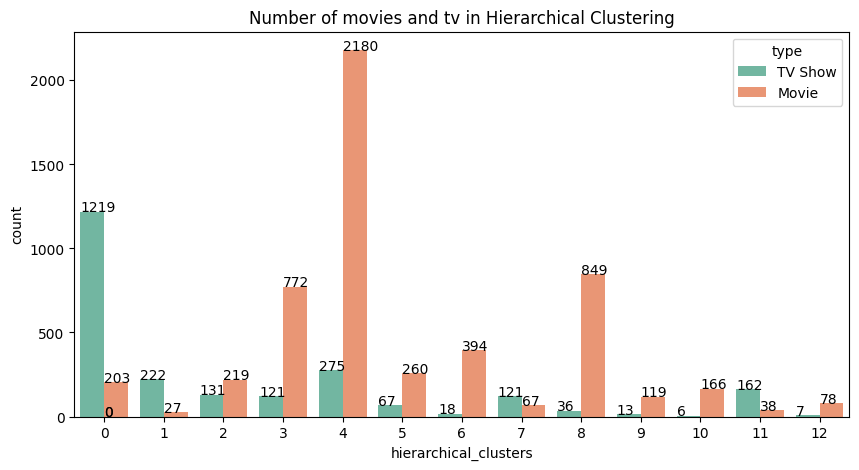

In [87]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='hierarchical_clusters',data=data, hue='type', palette='Set2')
plt.title('Number of movies and tv in Hierarchical Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))


Results: Successfully built 13 clusters using the Agglomerative (hierarchical) clustering algorithm.

**PCA-Based Scatter Plot for Hierarchical Clusters**

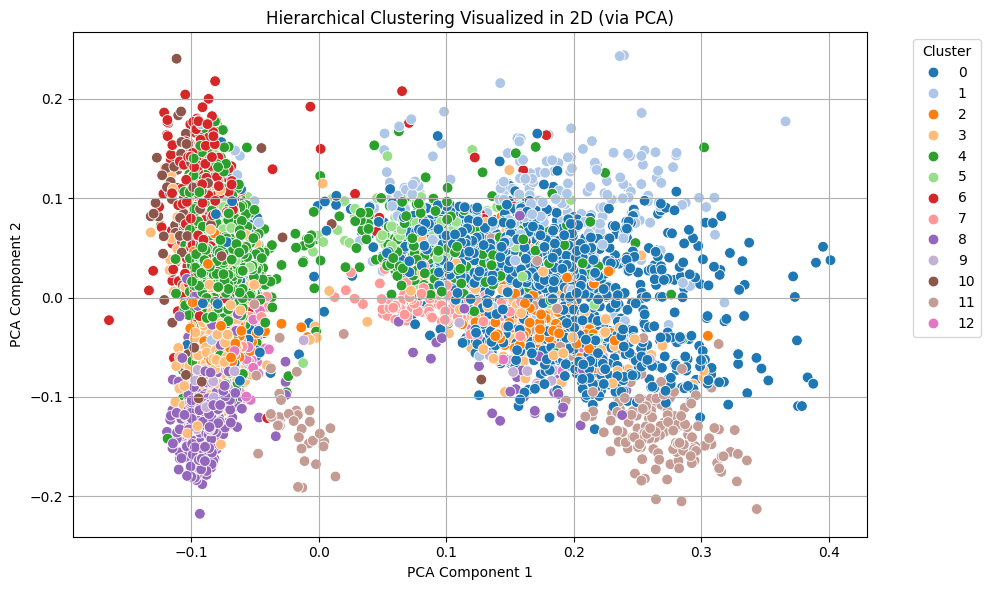

In [88]:
from sklearn.decomposition import PCA

# PCA to reduce X to 2D
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X)

# Add PCA result to data
data['pca_1_h'] = pca_result[:, 0]
data['pca_2_h'] = pca_result[:, 1]

# Plot PCA scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='pca_1_h', y='pca_2_h', hue='hierarchical_clusters', palette='tab20', s=60)
plt.title('Hierarchical Clustering Visualized in 2D (via PCA)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


**t-SNE-Based Scatter Plot**

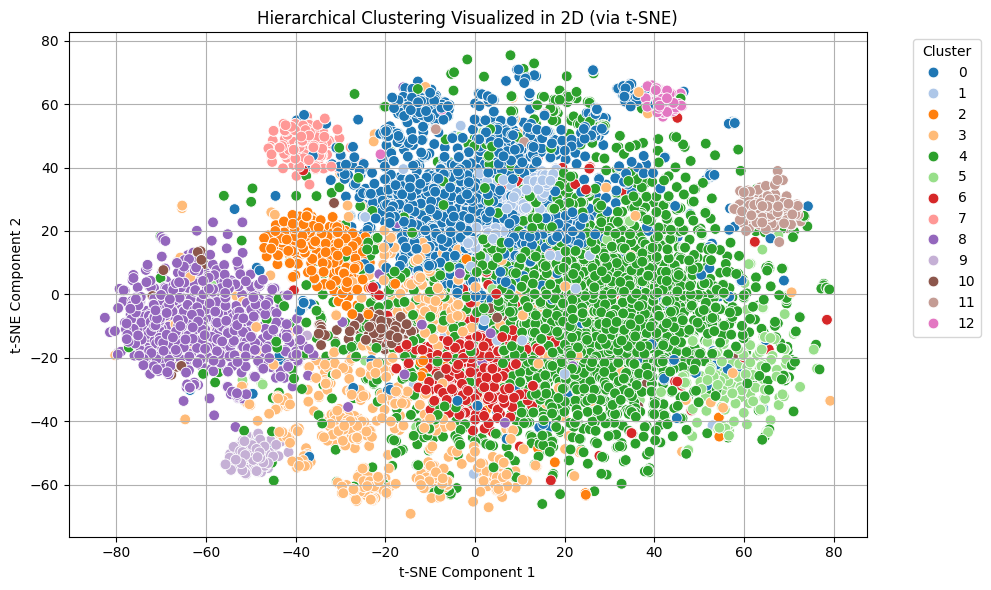

In [89]:
from sklearn.manifold import TSNE

# Run t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_result = tsne.fit_transform(X)

# Add to DataFrame
data['tsne_1_h'] = tsne_result[:, 0]
data['tsne_2_h'] = tsne_result[:, 1]

# Plot t-SNE
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='tsne_1_h', y='tsne_2_h', hue='hierarchical_clusters', palette='tab20', s=60)
plt.title('Hierarchical Clustering Visualized in 2D (via t-SNE)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


The t-SNE plot reveals that hierarchical clustering effectively partitions Netflix titles into 13 distinct groups. Several clusters (e.g., Clusters 2, 3, 7, 8, and 10) are tightly packed and isolated, indicating strong thematic or metadata similarities among the grouped titles. In contrast, larger clusters (like Cluster 4) span more space, suggesting a broader variety of content. The separation and shape of these clusters demonstrate the utility of hierarchical clustering in uncovering both well-defined and loosely grouped content structures.

In [111]:
from sklearn.metrics import silhouette_score
import numpy as np

# Calculate Silhouette Score (valid for any clustering)
hierarchical_silhouette_score = silhouette_score(X, hierarchical.labels_)

# Approximate distortion (optional, since inertia_ is not available)
def compute_distortion(X, labels):
    distortion = 0
    for label in np.unique(labels):
        cluster_points = X[labels == label]
        centroid = cluster_points.mean(axis=0)
        distortion += ((cluster_points - centroid) ** 2).sum()
    return distortion

# If X is a sparse matrix (like from TfidfVectorizer), convert to dense for computation
if hasattr(X, "toarray"):
    X_dense = X.toarray()
else:
    X_dense = X

hierarchical_distortion = compute_distortion(X_dense, hierarchical.labels_)

print("Distortion (approx):", hierarchical_distortion)
print("Silhouette Score:", hierarchical_silhouette_score)


Distortion (approx): 6205.993491818969
Silhouette Score: 0.0054141670559790045


In [113]:
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score

# Make sure X is dense if needed (e.g., if it's from TF-IDF)
if hasattr(X, "toarray"):
    X_dense = X.toarray()
else:
    X_dense = X

# Get cluster labels from hierarchical clustering
labels = hierarchical.labels_

# Calculate Calinski-Harabasz Score
ch_score = calinski_harabasz_score(X_dense, labels)

# Calculate Davies-Bouldin Score
db_score = davies_bouldin_score(X_dense, labels)

# Print the results
print("Calinski-Harabasz Score:", ch_score)
print("Davies-Bouldin Score:", db_score)


Calinski-Harabasz Score: 22.75004627672718
Davies-Bouldin Score: 8.541421572734377


Building wordclouds for different clusters in hierarchical Clustering

In [90]:
def hierarchical_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  data_wordcloud = data[['hierarchical_clusters',column_name]].dropna()
  data_wordcloud = data_wordcloud[data_wordcloud['hierarchical_clusters']==cluster_number]

  # text documents
  text = " ".join(word for word in data_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

Word Cloud on "title" column for different cluster

cluster 0


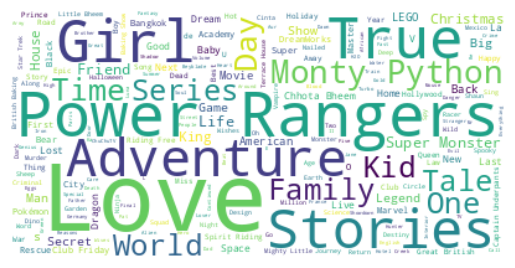

cluster 1


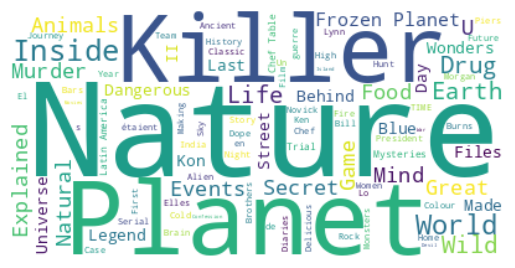

cluster 2


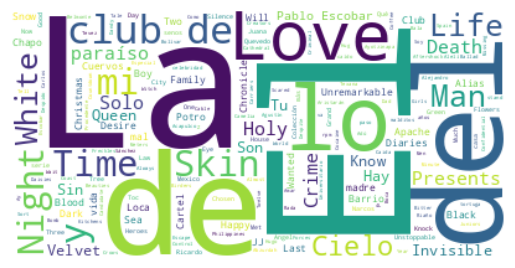

cluster 3


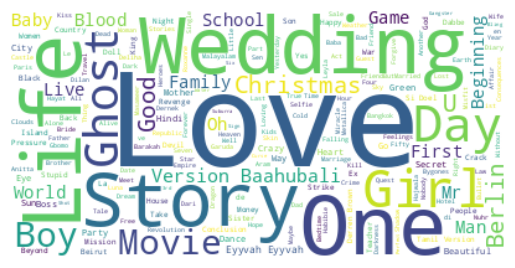

cluster 4


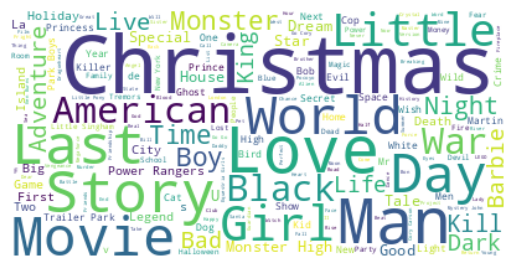

cluster 5


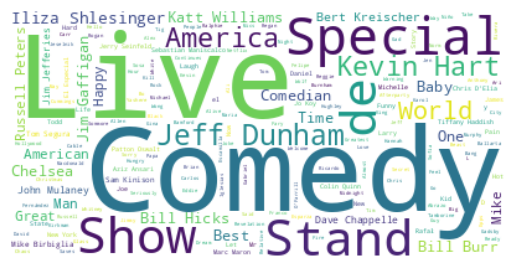

cluster 6


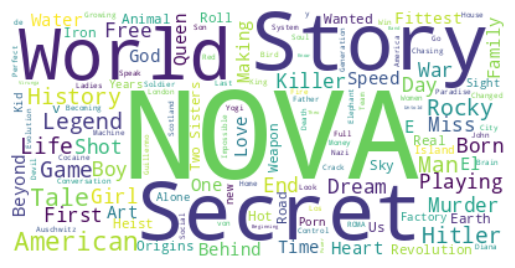

cluster 7


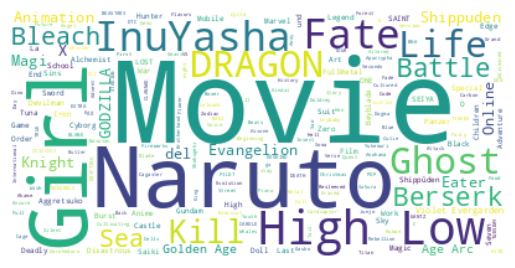

cluster 8


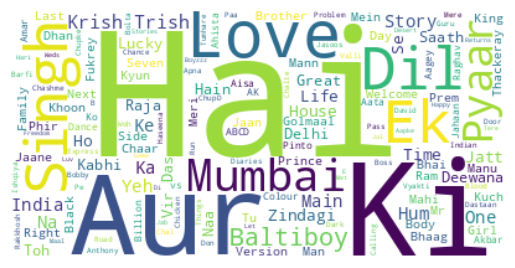

cluster 9


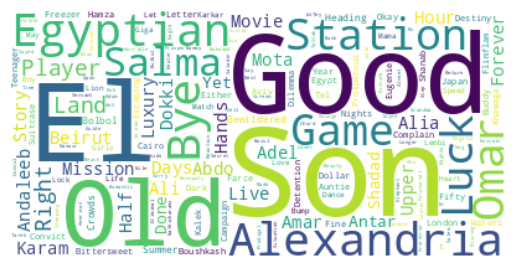

cluster 10


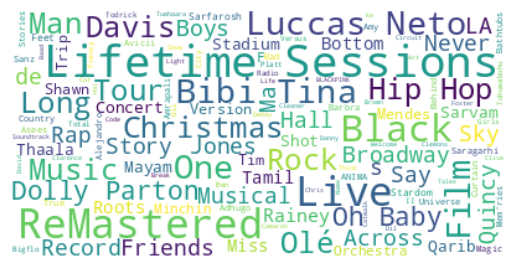

cluster 11


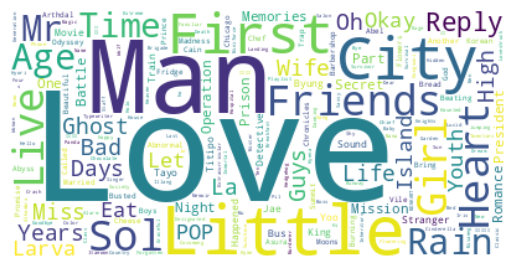

cluster 12


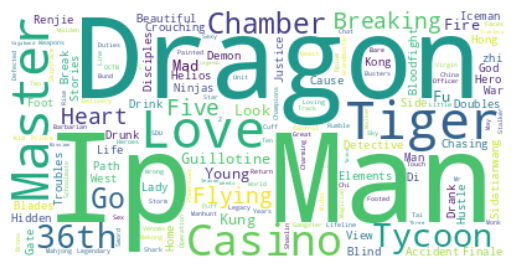

In [91]:
for i in range(13):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'title')

Word Cloud on "country" column for different cluster

cluster 0


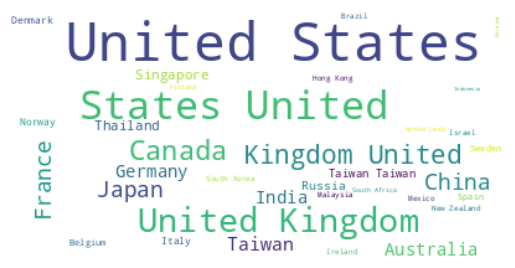

cluster 1


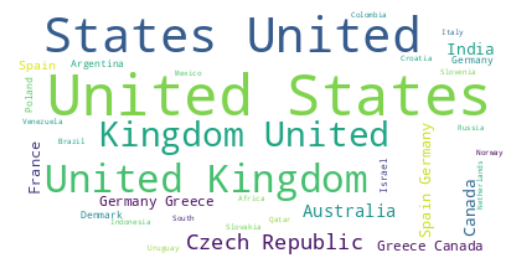

cluster 2


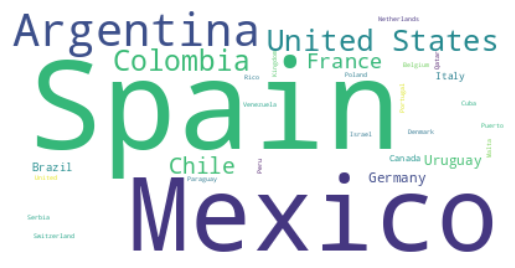

cluster 3


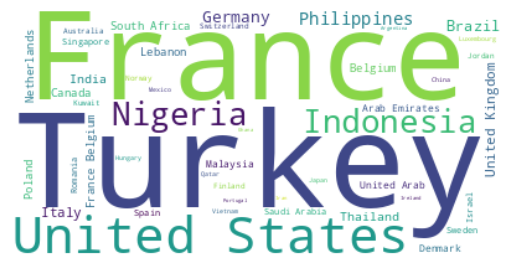

cluster 4


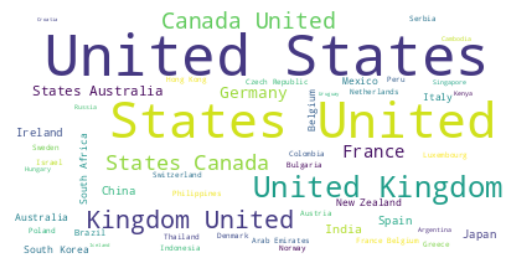

cluster 5


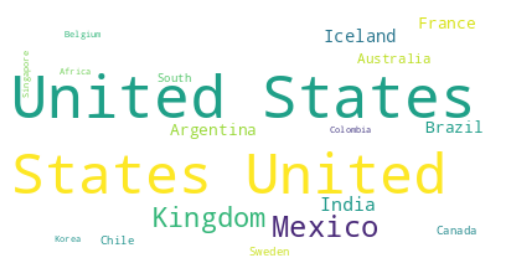

cluster 6


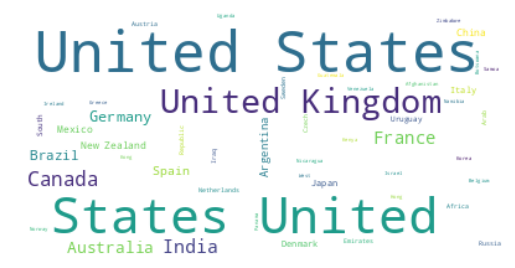

cluster 7


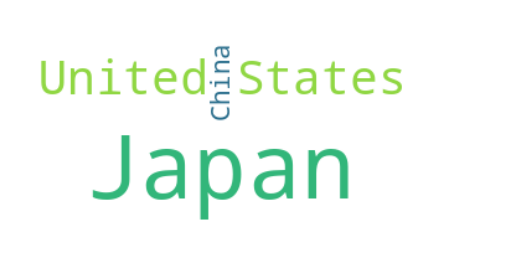

cluster 8


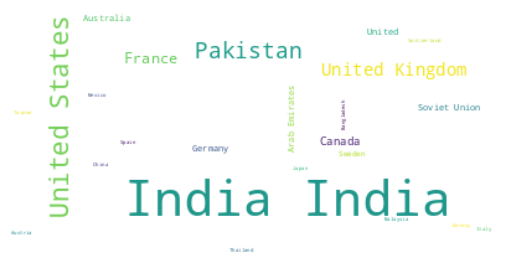

cluster 9


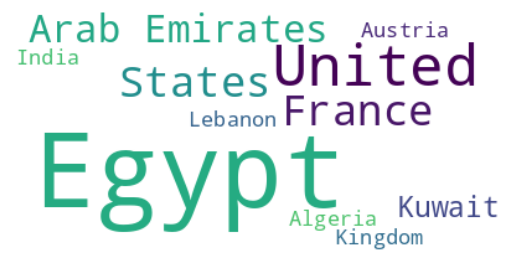

cluster 10


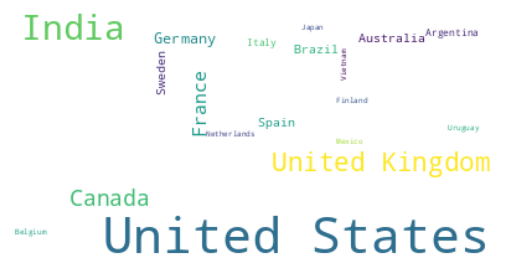

cluster 11


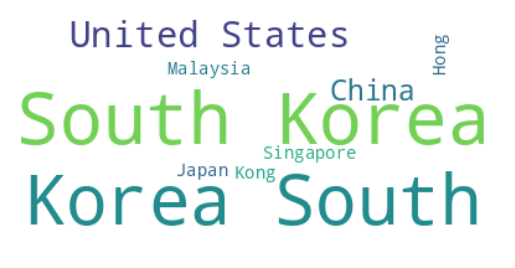

cluster 12


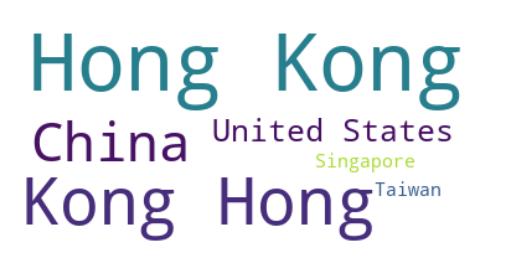

In [92]:
for i in range(13):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'country')

Word Cloud on "cast" column for different cluster

cluster 0


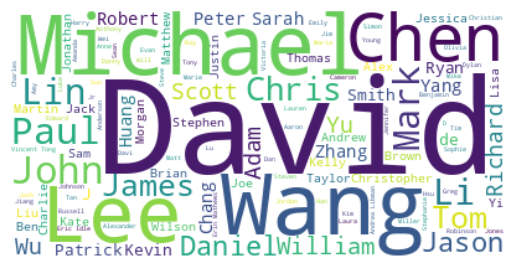

cluster 1


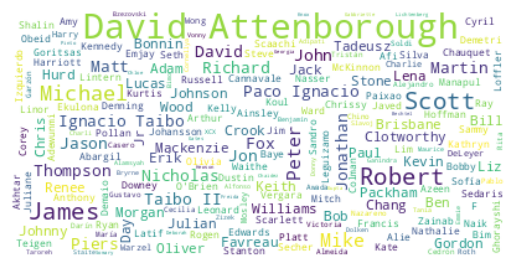

cluster 2


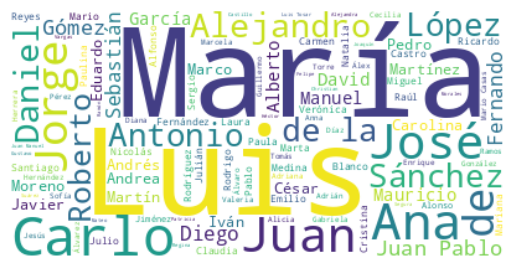

cluster 3


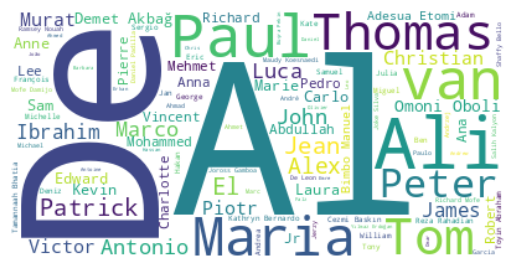

cluster 4


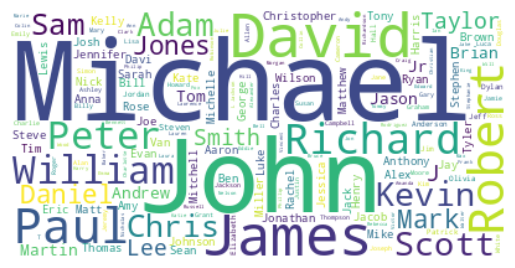

cluster 5


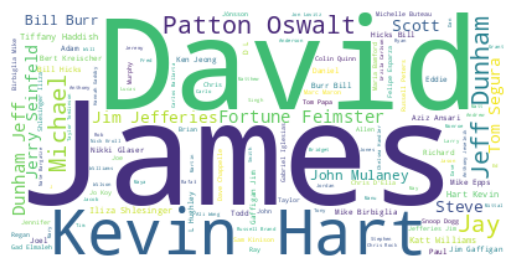

cluster 6


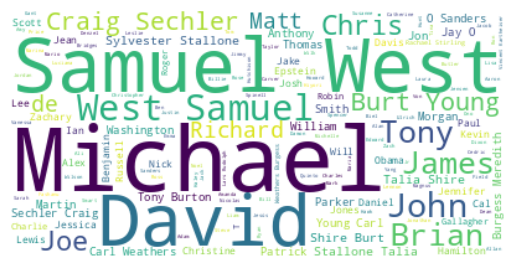

cluster 7


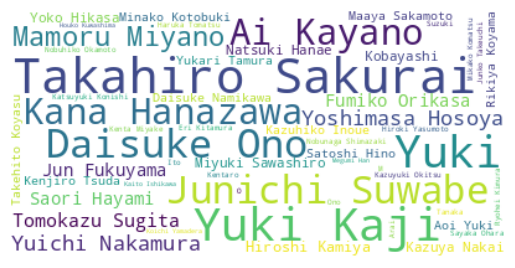

cluster 8


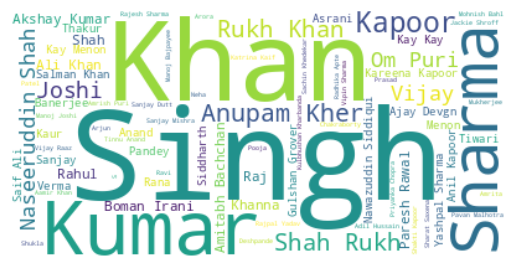

cluster 9


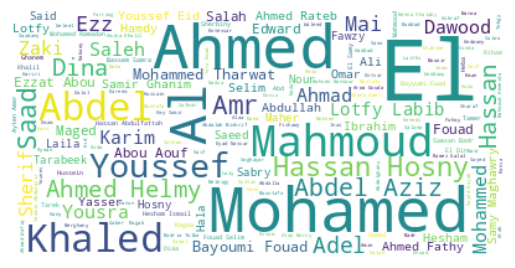

cluster 10


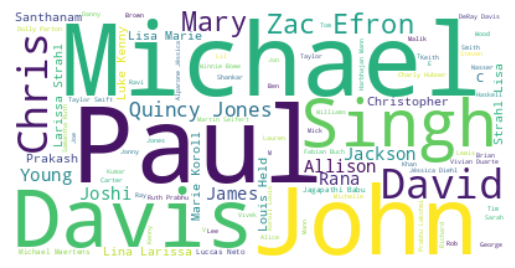

cluster 11


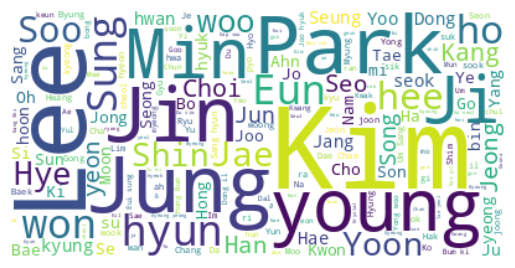

cluster 12


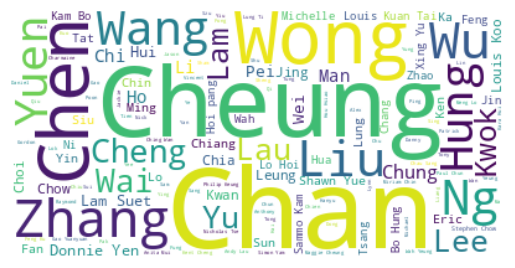

In [93]:

for i in range(13):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'cast')

Word Cloud on "listed_in (genre)" column for different cluster

cluster 0


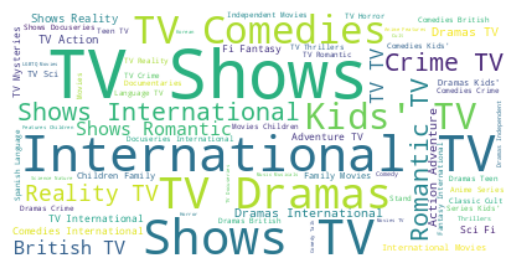

cluster 1


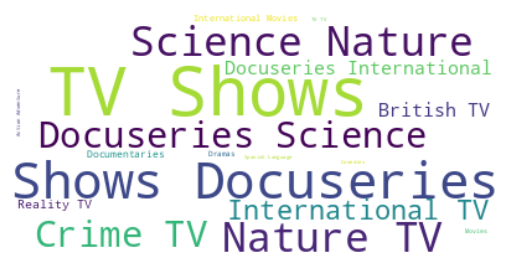

cluster 2


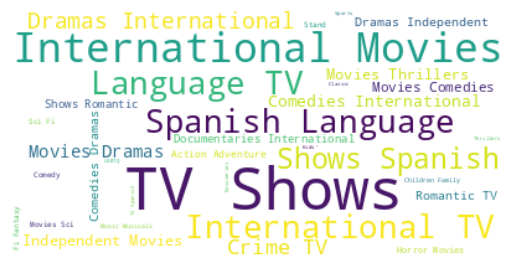

cluster 3


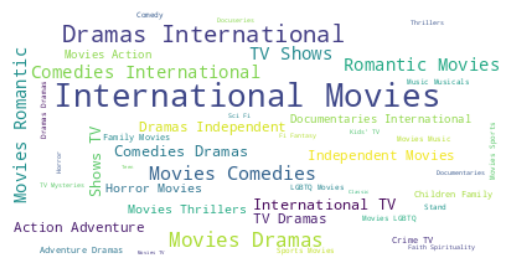

cluster 4


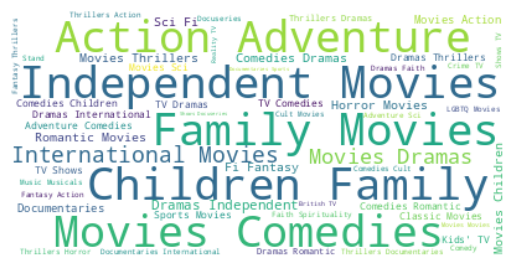

cluster 5


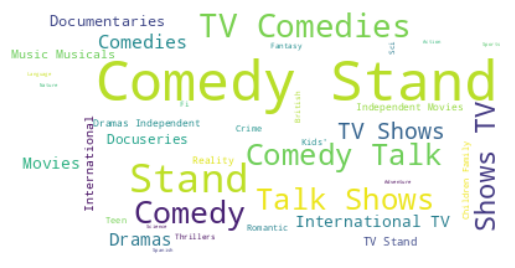

cluster 6


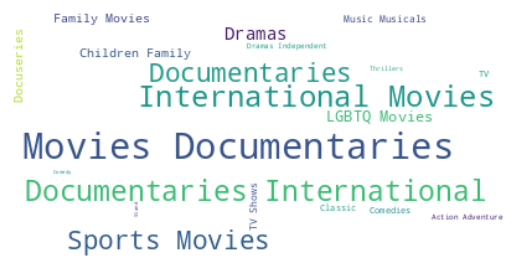

cluster 7


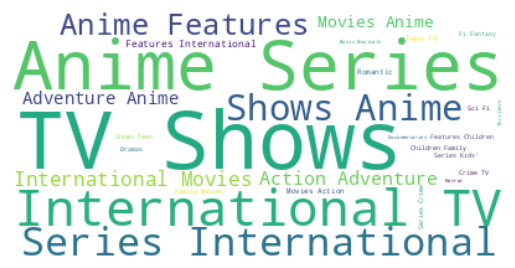

cluster 8


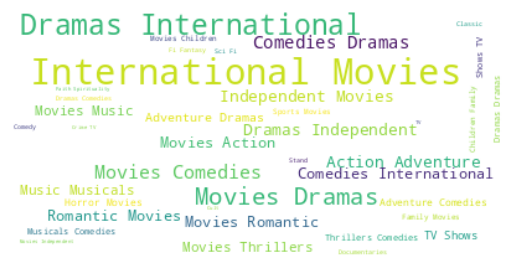

cluster 9


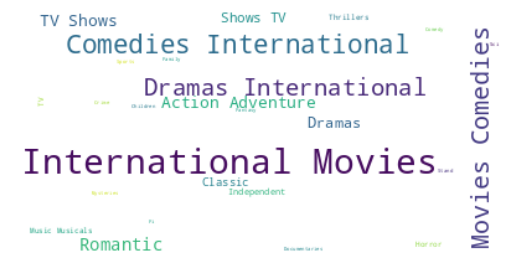

cluster 10


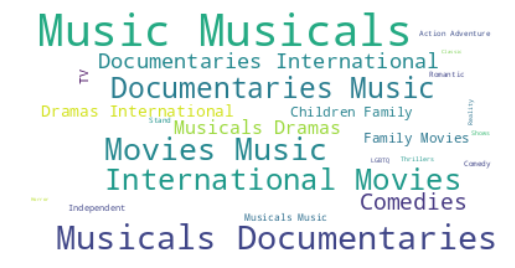

cluster 11


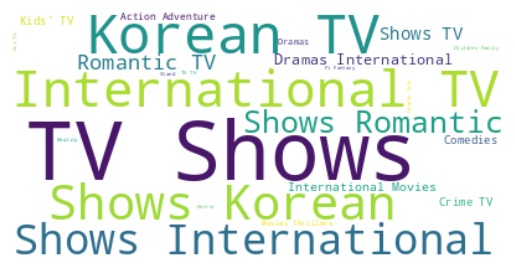

cluster 12


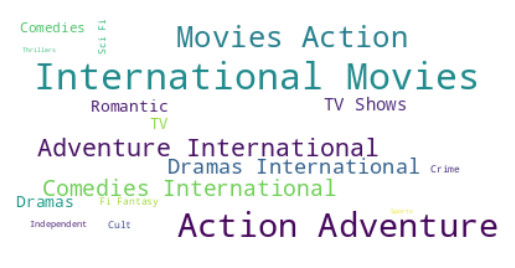

In [94]:
for i in range(13):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'listed_in')

In [109]:
data.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'clustering_attributes', 'kmeans_cluster', 'pca_1', 'pca_2', 'tsne_1',
       'tsne_2', 'hierarchical_clusters', 'pca_1_h', 'pca_2_h', 'tsne_1_h',
       'tsne_2_h'],
      dtype='object')

# **Recommendation System**

A content-based recommendation system suggests shows based on their similarity to what a user has already liked. It uses features like genre, cast, or description to compare items. Cosine similarity is commonly used to measure how closely two shows are related—higher scores mean more similarity, helping recommend shows that match the user’s preferences.

In [72]:
data[['show_id', 'title', 'clustering_attributes']]

,show_id,title,clustering_attributes
0,s1,3%,joão miguel bianca comparato michel gome rodol...
1,s2,7:19,jorg michel grau demián bichir héctor bonilla ...
2,s3,23:59,gilbert chan tedd chan stella chung henley hii...
3,s4,9,shane acker elijah wood john c reilli jennif c...
4,s5,21,robert luket jim sturgess kevin spacey kate bo...
...,...,...,...
7782,s7783,Zozo,josef fare imad creidi antoinett turk elia ger...
7783,s7784,Zubaan,mozez singh vicki kaushal sarahjan dia raaghav...
7784,s7785,Zulu Man in Japan,nasti c movi documentari intern movi music mus...
7785,s7786,Zumbo's Just Desserts,adriano zumbo rachel khoo tv show australia in...


In [73]:
# defining new dataframe for building recommandation system
recommender_df = data.copy()

# reseting index
recommender_df.reset_index(inplace=True)

# checking whether or not reset index properly
recommender_df[['show_id', 'title', 'clustering_attributes']]

,show_id,title,clustering_attributes
0,s1,3%,joão miguel bianca comparato michel gome rodol...
1,s2,7:19,jorg michel grau demián bichir héctor bonilla ...
2,s3,23:59,gilbert chan tedd chan stella chung henley hii...
3,s4,9,shane acker elijah wood john c reilli jennif c...
4,s5,21,robert luket jim sturgess kevin spacey kate bo...
...,...,...,...
7765,s7783,Zozo,josef fare imad creidi antoinett turk elia ger...
7766,s7784,Zubaan,mozez singh vicki kaushal sarahjan dia raaghav...
7767,s7785,Zulu Man in Japan,nasti c movi documentari intern movi music mus...
7768,s7786,Zumbo's Just Desserts,adriano zumbo rachel khoo tv show australia in...


In [74]:
# dropping show-id and index column
recommender_df.drop(columns=['index', 'show_id'], inplace=True)

In [75]:

print(f"before reset index id for movie 'Zero' : {data[data['title'] == 'Zozo'].index[0]}")
print(f"after reset index id for movie 'Zero': {recommender_df[recommender_df['title'] == 'Zozo'].index[0]}")

before reset index id for movie 'Zero' : 7782
after reset index id for movie 'Zero': 7765


In [76]:
# calling out transformed array independent features created from clustering_attributes(cluster) column after performing PCA for dimenssionality reduction.
X

array([[ 0.17772836, -0.0257019 , -0.00617769, ...,  0.00526489,
         0.00488797,  0.00961982],
       [-0.06439092, -0.0416359 , -0.00150116, ...,  0.00131618,
        -0.00381571,  0.00379572],
       [-0.06893011, -0.04175767, -0.02945331, ..., -0.01202554,
         0.00369398,  0.01054153],
       ...,
       [-0.10316646,  0.06188088,  0.29838614, ...,  0.01098336,
         0.01195185,  0.01484559],
       [ 0.18334127, -0.00144145,  0.02195159, ...,  0.0180186 ,
         0.00651522,  0.006872  ],
       [-0.11168239,  0.24032875,  0.35865389, ...,  0.00082387,
        -0.00679866,  0.00154187]])

In [77]:

# calculate cosine similarity
similarity = cosine_similarity(X)
similarity

array([[ 1.00000000e+00,  7.53275563e-02,  8.49003500e-03, ...,
        -3.18862632e-02,  4.15804020e-02, -3.12643344e-02],
       [ 7.53275563e-02,  1.00000000e+00, -8.58947705e-04, ...,
         5.83156328e-02, -1.81660238e-02, -1.78703788e-02],
       [ 8.49003500e-03, -8.58947705e-04,  1.00000000e+00, ...,
        -1.72826747e-04, -1.83241868e-02, -1.90574957e-02],
       ...,
       [-3.18862632e-02,  5.83156328e-02, -1.72826747e-04, ...,
         1.00000000e+00, -2.02844734e-02,  2.56063290e-01],
       [ 4.15804020e-02, -1.81660238e-02, -1.83241868e-02, ...,
        -2.02844734e-02,  1.00000000e+00,  1.45805203e-02],
       [-3.12643344e-02, -1.78703788e-02, -1.90574957e-02, ...,
         2.56063290e-01,  1.45805203e-02,  1.00000000e+00]])

In [78]:

def recommend(movie):
    '''
    This function list down top ten movies on the basis of similarity score for that perticular movie.
    '''
    print(f"If you liked '{movie}', you may also enjoy: \n")

    # find out index position
    index = recommender_df[recommender_df['title'] == movie].index[0]

    # sorting on the basis of simliarity score, In order to find out distaces from recommended one
    distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x:x[1])

    # listing top ten recommenaded movie
    for i in distances[1:11]:
        print(data.iloc[i[0]].title)


In [79]:
recommend('3 Generations')

If you liked '3 Generations', you may also enjoy: 

The Sea of Trees
20th Century Women
Survivors Guide to Prison
Back to 1989
The Impossible
My Entire High School Sinking Into the Sea
A Bad Moms Christmas
The Bleeder
Maria Bamford: The Special Special Special
Transformer


In [80]:
recommend('100 Days Of Solitude')

If you liked '100 Days Of Solitude', you may also enjoy: 

The Skin of the Wolf
The Last Resort
Beary Tales
Chasing Coral
La Gran Ilusión
Magical Andes
Sunday's Illness
Expedition China
The Queen
Our Planet


# **Identify regional or genre-specific viewing trends**

In [81]:
# First, append cluster labels to the original data
data['cluster'] = kmeans.labels_  # or hierarchical.labels_ if using hierarchical clustering

# Split genres and explode into multiple rows for proper aggregation
genre_trend = data[['cluster', 'listed_in']].copy()
genre_trend['listed_in'] = genre_trend['listed_in'].str.split(', ')
genre_trend = genre_trend.explode('listed_in')

# Count top genres per cluster
top_genres_per_cluster = genre_trend.groupby(['cluster', 'listed_in']).size().reset_index(name='count')
top_genres = top_genres_per_cluster.sort_values(['cluster', 'count'], ascending=[True, False])

# Display top 3 genres per cluster
top_genres.groupby('cluster').head(3)


,cluster,listed_in,count
4,0,Documentaries,772
9,0,International Movies,261
12,0,Music & Musicals,112
25,1,Dramas,784
20,1,Comedies,691
18,1,Children & Family Movies,472
52,2,International TV Shows,1197
62,2,TV Dramas,691
61,2,TV Comedies,481
80,3,International Movies,2042


# **Similarly for Regions (Countries)**

In [82]:
country_trend = data[['cluster', 'country']].copy()
country_trend['country'] = country_trend['country'].str.split(', ')
country_trend = country_trend.explode('country')

# Count top countries per cluster
top_countries = (
    country_trend.groupby(['cluster', 'country'])
    .size()
    .reset_index(name='count')
    .sort_values(['cluster', 'count'], ascending=[True, False])
)

# Display top 3 countries per cluster
top_countries.groupby('cluster').head(3)


,cluster,country,count
66,0,United States,482
64,0,United Kingdom,118
0,0,,43
143,1,United States,2000
142,1,United Kingdom,323
83,1,Canada,224
208,2,United States,764
145,2,,271
207,2,United Kingdom,252
241,3,India,875


Results: Each content cluster revealed dominant genres and production regions—for example, clusters were often centered around popular themes like "Crime & Thriller/documentaries" from the US, helping inform targeted content acquisition strategies

# **Improve user experience by browsing by theme/mood**

In [83]:
def explore_by_cluster(cluster_number):
    results = data[data['cluster'] == cluster_number][['title', 'listed_in', 'country']]
    return results.reset_index(drop=True)

explore_by_cluster(2)


,title,listed_in,country
0,3%,"International TV Shows, TV Dramas, TV Sci-Fi &...",Brazil
1,46,"International TV Shows, TV Dramas, TV Mysteries",Turkey
2,1983,"Crime TV Shows, International TV Shows, TV Dramas","Poland, United States"
3,1994,"Crime TV Shows, Docuseries, International TV S...",Mexico
4,Feb-09,"International TV Shows, TV Dramas",
...,...,...,...
2284,Zindagi Gulzar Hai,"International TV Shows, Romantic TV Shows, TV ...",Pakistan
2285,Zoids Wild,"Anime Series, Kids' TV",Japan
2286,Zombie Dumb,"Kids' TV, Korean TV Shows, TV Comedies",
2287,Zona Rosa,"International TV Shows, Spanish-Language TV Sh...",Mexico


In [84]:
for c in sorted(data['cluster'].unique()):
    genres = top_genres[top_genres['cluster'] == c].head(3)['listed_in'].tolist()
    print(f"Cluster {c}: Likely theme - {', '.join(genres)}")


Cluster 0: Likely theme - Documentaries, International Movies, Music & Musicals
Cluster 1: Likely theme - Dramas, Comedies, Children & Family Movies
Cluster 2: Likely theme - International TV Shows, TV Dramas, TV Comedies
Cluster 3: Likely theme - International Movies, Dramas, Comedies


Result: Thematic Clusters help viewers explore content based on mood or theme rather than rigid genres.